In [1]:
#!/usr/bin/env Rscript 
library(dplyr)
library(Seurat)
library(httr)
library(readr)
library(pheatmap)
library(RColorBrewer)
library(ggplot2)
library(cowplot)
library(patchwork)
library(unixtools)
library(ggrepel)
library(repr)
library(ggmin)
library(harmony)
library(SeuratWrappers)
library(Nebulosa)
library(ggthemes)
set_config(config(ssl_verifypeer = 0L))
ulimit::memory_limit(100000)
set.tempdir("/datastore/lucy/tmp/")
setwd("/datastore/lucy/SynovialAtlas/CD1c")
options(warn = -1, verbose=FALSE)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject


Attaching package: ‘patchwork’


The following object is masked from ‘package:cowplot’:

    align_plots


Loading required package: Rcpp


Attaching package: ‘ggthemes’


The following object is masked from ‘package:cowplot’:

    theme_map




soft  hard 
1e+05   Inf

In [2]:
myeloid <- readRDS("/datastore/lucy/SynovialAtlas/cache/renamed.myeloid.rds")

In [3]:
myeloid$clusters <- as.ordered(factor(myeloid$clusters, levels=c("FCGR3A+ Monocyte","CD14+FCGR3A+ Monocyte","CD14highS100A12+ Monocyte",
                                                                               "ISG15+ Intermediate",'CXCL10+STAT1+ Macrophage',"TNF+ICAM1+ Macrophage",'C1QAhighHMOX1+ Intermediate',
                                                                "SPP1+ Macrophage","SPP1+TREM2low Macrophage","TREM2+ Macrophage", "FOLR2highLYVE1+ Macrophage","FOLR2highSELENOP+ Macrophage",
                                                                               "FOLR2highEGR1+ Macrophage","FOLR2highCLEC10A+ Macrophage",
                                                               'SDS+NR4A3+CXCR4+ iDC3',"CD1c+ cDC","CCR7+/CLEC9A+ DC1")))
Idents(myeloid) <- "clusters"

In [44]:
cols <- c("darkorchid3","#938AF1",
                  "#EF90D4", "#EB4691","deeppink3","deeppink4","#FF9300",
      "#EA3424","#481BA7","dodgerblue2",   "#9aecfa", "#27CAF3","#27CAF3",
                       "#51F6BC","yellow", 
                  "#B4FF00","#68B731","darkgreen")
names(cols) <- levels(myeloid$clusters)

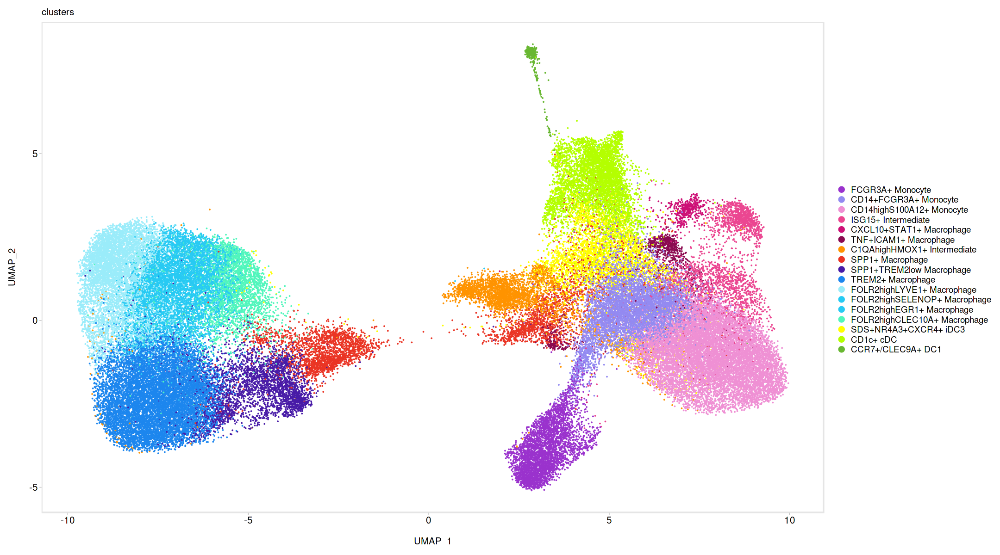

In [45]:
options(repr.plot.width=18, repr.plot.height=10)
DimPlot(myeloid, group.by="clusters", cols=cols) + theme_powerpoint()

In [46]:
levels(Idents(myeloid))

[1] "FCGR3A+ Monocyte"             "CD14+FCGR3A+ Monocyte"       
 [3] "CD14highS100A12+ Monocyte"    "ISG15+ Intermediate"         
 [5] "CXCL10+STAT1+ Macrophage"     "TNF+ICAM1+ Macrophage"       
 [7] "C1QAhighHMOX1+ Intermediate"  "SPP1+ Macrophage"            
 [9] "SPP1+TREM2low Macrophage"     "TREM2+ Macrophage"           
[11] "FOLR2highLYVE1+ Macrophage"   "FOLR2highSELENOP+ Macrophage"
[13] "FOLR2highEGR1+ Macrophage"    "FOLR2highCLEC10A+ Macrophage"
[15] "SDS+NR4A3+CXCR4+ iDC3"        "CD1c+ cDC"                   
[17] "CCR7+/CLEC9A+ DC1"

In [47]:
mono.mac.dc <- subset(myeloid, idents=c('FCGR3A+ Monocyte','CD14+FCGR3A+ Monocyte','CD14highS100A12+ Monocyte',
                                       "FOLR2highCLEC10A+ Macrophage",
                                        'SDS+NR4A3+CXCR4+ iDC3',"CD1c+ cDC","CCR7+/CLEC9A+ DC1"))

In [6]:
#Create data frame for information required to plot 
umap <- data.frame(rownames(mono.mac.dc@meta.data),Embeddings(mono.mac.dc, reduction = "umap")[,1], Embeddings(mono.mac.dc, reduction = "umap")[,2],
                   mono.mac.dc$Tissue,mono.mac.dc$condition,mono.mac.dc$clusters)
colnames(umap) <- c("ID","UMAP1", "UMAP2", "facet_col", "Group", "color_col")

allcells <-  data.frame(Embeddings(myeloid, reduction = "umap")[,1], Embeddings(myeloid, reduction = "umap")[,2])
colnames(allcells) <- c("UMAP1", "UMAP2")

ERROR: Error in Embeddings(myeloid, reduction = "umap"): object 'myeloid' not found


In [7]:
heme_specific <- theme_linedraw() + theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank()) + theme(plot.title=element_text(size=30, face="bold"), axis.text=element_text(size=15), axis.title=element_text(size=15)) + theme(strip.background = element_rect(colour = "black", fill = "white"),strip.text = element_text(size = 20, color="black"))

In [49]:
umap$color_col <- as.ordered(factor(umap$color_col, levels=levels(myeloid$clusters)))


In [51]:
umap <- umap[order(umap$ID),]

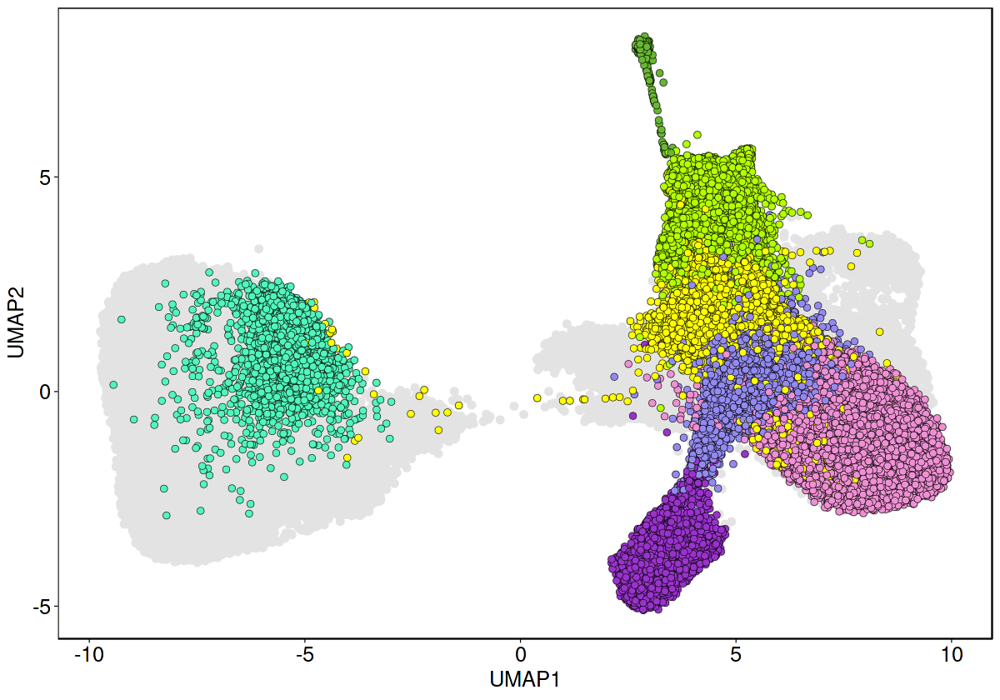

In [52]:
options(repr.plot.width=10, repr.plot.height=7)
ggplot(umap, aes(x=UMAP1, y=UMAP2)) + 
  geom_point(data=allcells, colour="grey89", fill="grey89", size=2, shape=21) +
  geom_point(aes(fill=factor(color_col)),color="black", size=2, shape=21, stroke = 1/5) + 
  scale_fill_manual(name=NULL, labels = levels(umap$color_col), guide="legend", values=cols) + theme_specific + guides(fill=FALSE) 

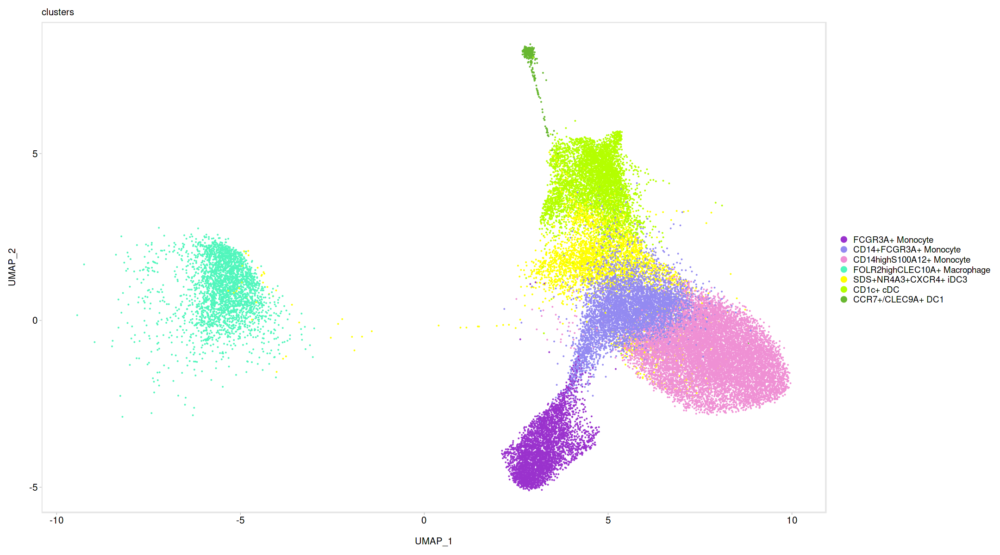

In [18]:
options(repr.plot.width=18, repr.plot.height=10)
DimPlot(mono.mac.dc,  group.by="clusters",cols=cols) + theme_powerpoint()

In [11]:
mono.mac.dc$subgroup <- mono.mac.dc$group

In [12]:
mono.mac.dc$group <- plyr::revalue(as.character(mono.mac.dc$group),
                                c('Naive RA'='Active RA',
                                 'Resistant to cDMARDs RA'='Active RA',
                                 'Resistant to bDMARDs RA'='Active RA',
                                 'Difficult to treat RA'='Active RA'))

In [13]:
mono.mac.dc$condition <- paste0(mono.mac.dc$Tissue, "_",mono.mac.dc$group)
mono.mac.dc$replicate <- mono.mac.dc$Unique_ID

In [14]:
mono.mac.dc$condition <- as.ordered(factor(mono.mac.dc$condition, levels=c("PB_Healthy","PB_Active RA","ST_Healthy","ST_Active RA",
                                                    "ST_Remission RA")))

In [15]:
#Continue with typical preprocessing pipeline
mono.mac.dc <- mono.mac.dc %>%
    NormalizeData() %>%
    FindVariableFeatures(selection.method = "vst", nfeatures = 2000) %>% 
    ScaleData() %>% RunPCA()

Centering and scaling data matrix

PC_ 1 
Positive:  TXNIP, FCN1, RIPOR2, FGR, RAC2, LYST, POU2F2, SAMHD1, MEGF9, CD52 
	   FOS, PECAM1, VCAN, DUSP6, ITGA4, ITGAL, CD36, SELL, ZYX, CDC42EP3 
	   MT-ATP8, SIRPB1, ADA2, DUSP1, MT-ND4L, SPN, LRRK2, CSF3R, TMEM154, MT-ND5 
Negative:  LMNA, GPR183, C1QA, FTH1, C1QB, C1QC, CTSL, HLA-DPB1, RNASE1, CREM 
	   CD63, HLA-DRB1, LGMN, CD83, VSIG4, HLA-DQB1, HLA-DQA1, PLAUR, HLA-DMA, HLA-DRA 
	   PLTP, FOLR2, A2M, GPNMB, UBC, NR4A3, SGK1, RASGEF1B, RGCC, CXCL2 
PC_ 2 
Positive:  RPS17, LGALS1, ALDOA, GPX1, CFP, RPS10, TIMP1, S100A10, S100A12, LGALS2 
	   S100A8, FTH1, S100A9, LST1, CRIP1, RETN, ZNF90, NCF1, MIF, MCEMP1 
	   MGST1, C15orf48, NEAT1, UPP1, LYZ, CYP1B1, FTL, IFI30, PSME2, ISG15 
Negative:  MT-ND5, MT-ATP8, SELENOP, MT-ND4L, RHOB, KLF4, ADA2, KLF6, JUN, MATR3 
	   UCP2, MS4A7, ITGA4, FCGR3A, ZFP36, SIGLEC10, FOSB, CTSB, KLF2, MTSS1 
	   ZYX, SLCO2B1, MAF, LILRB1, PECAM1, CTSC, ZFP36L1, NR4A1, PIK3AP1, MARCKS 
PC_ 3 
Positive:  S100A9, S1

In [16]:
#Preintegration
mono.mac.dc <- RunUMAP(object = mono.mac.dc, reduction = "pca", dims = 1:40)

23:06:58 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

23:06:58 Read 37725 rows and found 40 numeric columns

23:06:58 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

23:06:58 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

23:07:03 Writing NN index file to temp file /datastore/lucy/tmp//file2482cede2d6ab

23:07:03 Searching Annoy index using 1 thread, search_k = 3000

23:07:16 Annoy recall = 100%

23:07:17 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

23:07:19 Initializing from normalized Laplac

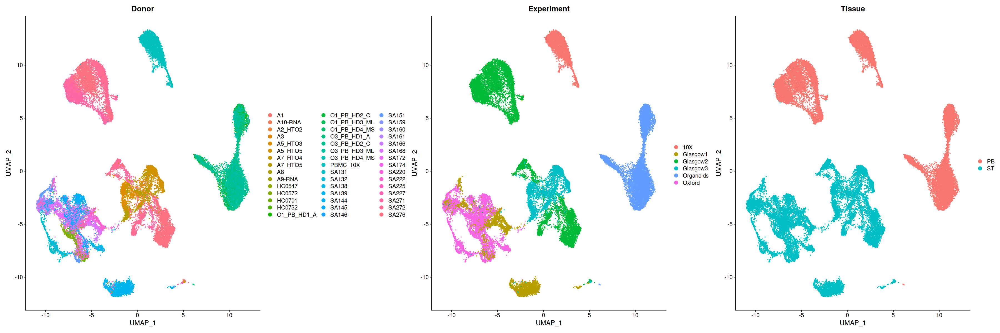

In [17]:
options(repr.plot.width=30, repr.plot.height=10)
DimPlot(mono.mac.dc, group.by=c("Donor","Experiment","Tissue"))

In [18]:
#Harmonize
mono.mac.dc <- mono.mac.dc %>% 
   RunHarmony(group.by.vars=c("Donor","Experiment","Tissue","Platform"), theta=c(0,1,1,2))

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony converged after 4 iterations

23:11:09 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

23:11:09 Read 37725 rows and found 20 numeric columns

23:11:09 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

23:11:09 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

23:11:14 Writing NN index file to temp file /datastore/lucy/tmp//file2482ce51f48d29

23:11:14 Searching Annoy index using 1 thread, search_k = 3000

23:11:29 Annoy recall = 100%

23:11:30 Commencing smooth kNN distance calibra

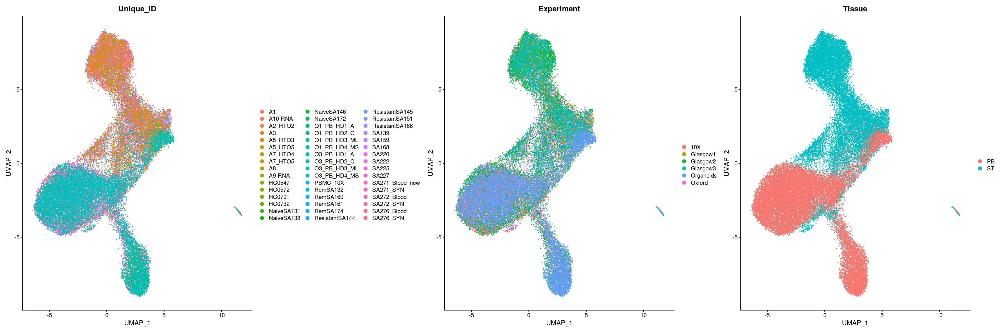

In [19]:
options(repr.plot.width=30, repr.plot.height=10)
DimPlot(mono.mac.dc, group.by=c("Unique_ID","Experiment","Tissue"))

In [20]:
#Run UMAP and clustering 
mono.mac.dc <- RunUMAP(object = mono.mac.dc, reduction = "harmony", dims = 1:20)
mono.mac.dc <- FindNeighbors(object = mono.mac.dc, reduction = "harmony", dims = 1:20)
mono.mac.dc <- FindClusters(mono.mac.dc, res=2)

23:11:53 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

23:11:53 Read 37725 rows and found 20 numeric columns

23:11:53 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

23:11:53 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

23:11:57 Writing NN index file to temp file /datastore/lucy/tmp//file2482ce772932ef

23:11:58 Searching Annoy index using 1 thread, search_k = 3000

23:12:13 Annoy recall = 100%

23:12:14 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

23:12:16 Initializing from normalized Lapla

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 37725
Number of edges: 1085080

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7360
Number of communities: 24
Elapsed time: 20 seconds


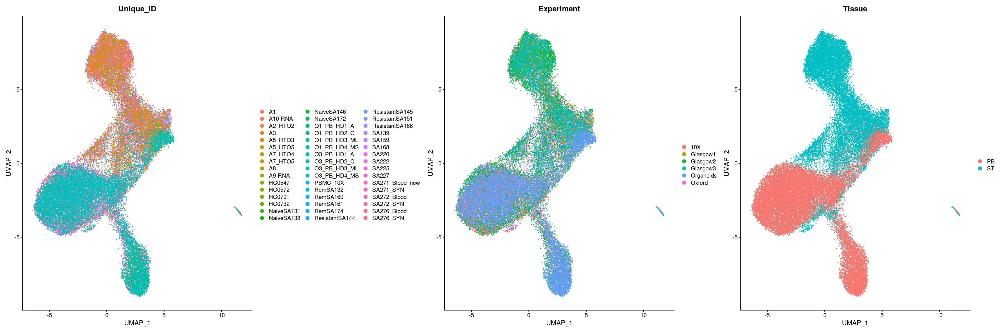

In [21]:
options(repr.plot.width=30, repr.plot.height=10)
DimPlot(mono.mac.dc, group.by=c("Unique_ID","Experiment","Tissue"))

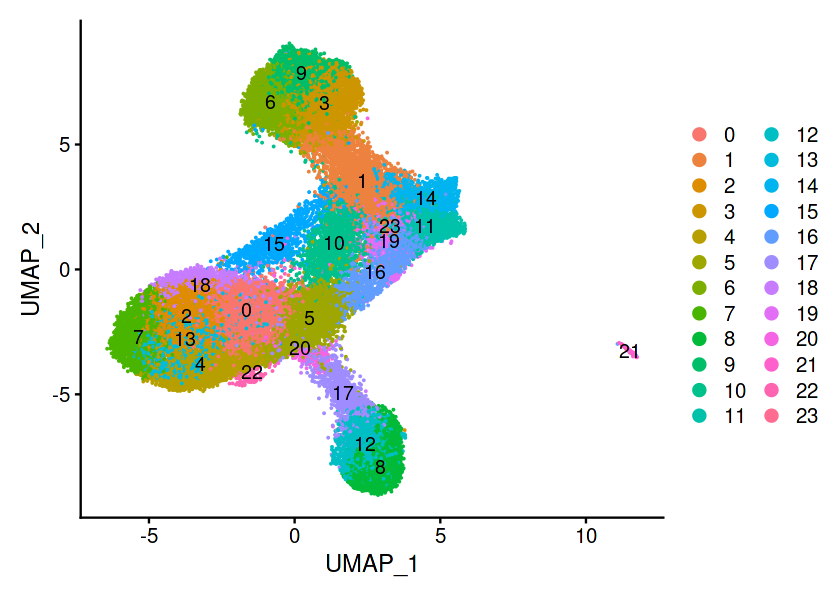

In [22]:
options(repr.plot.width=7, repr.plot.height=5)
DimPlot(mono.mac.dc, label=TRUE)

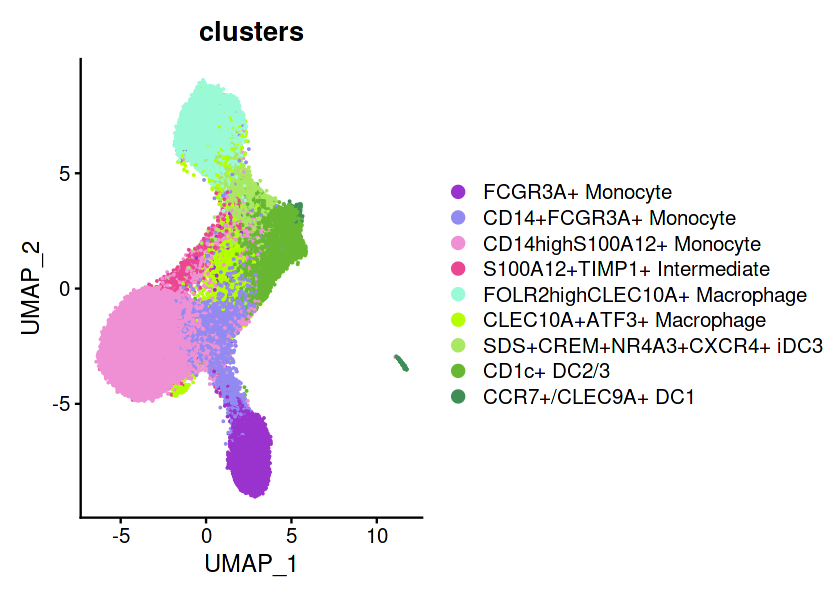

In [23]:
options(repr.plot.width=7, repr.plot.height=5)
DimPlot(mono.mac.dc, label=FALSE, group.by="clusters", cols=orig.cols)

In [48]:
mono.mac.dc$integrated.pb.clusters <- as.ordered(factor(mono.mac.dc$integrated.pb.clusters, levels=c('CLEC9A+ DC1','CD1c++ DC2','CD1c+CD14-CD163+ DC3','CD1c-CD14lowCD163+ iDC3','CD14highS100A12+ Monocyte','CD14+FCGR3A+ Monocyte','FCGR3A+ Monocyte','FCGR3A+C1QA+ Monocyte')))
pb.cols <- c('darkorchid4',"#FF00BF","red","orange",'#80FF00',"yellow",
                  '#00FFFF','#0040FF','#8000FF')

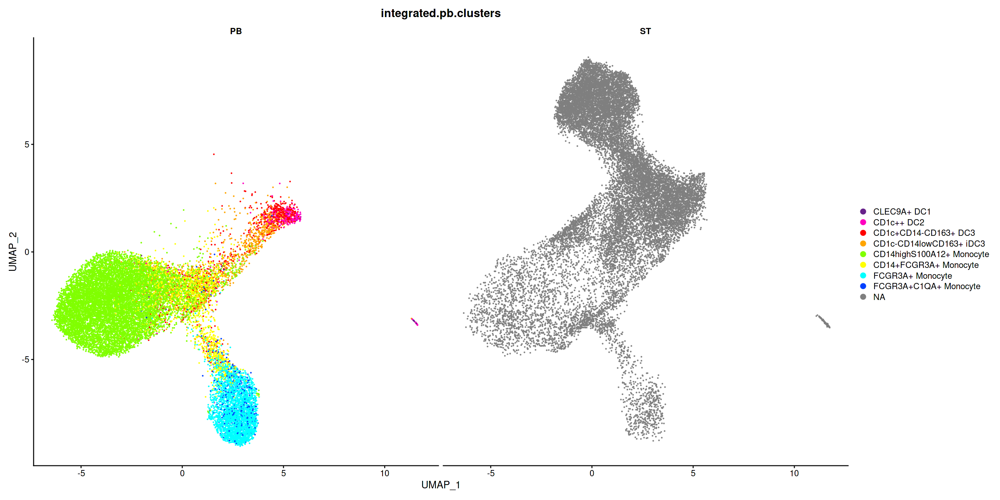

In [50]:
options(repr.plot.width=20, repr.plot.height=10)
DimPlot(mono.mac.dc,  split.by="Tissue", group.by="integrated.pb.clusters",cols=pb.cols)

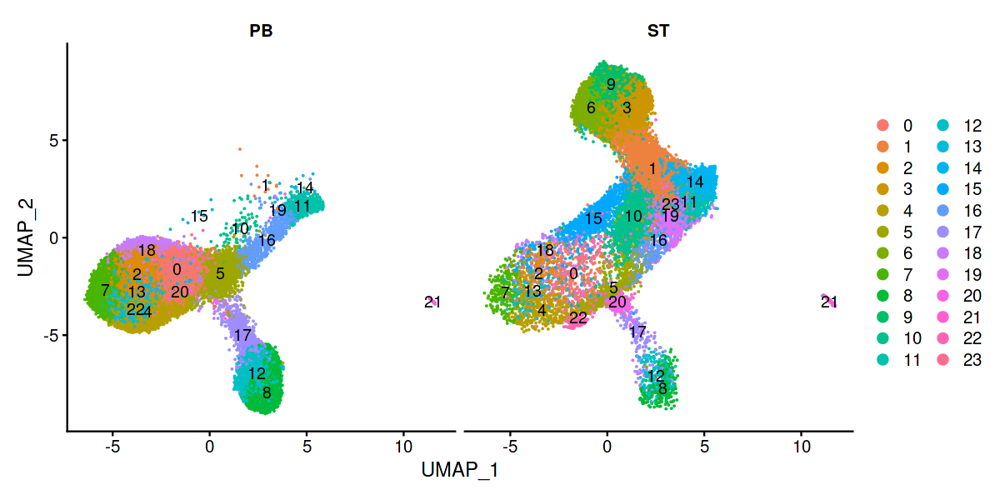

In [81]:
options(repr.plot.width=10, repr.plot.height=5)
DimPlot(mono.mac.dc, split.by=c("Tissue"), label=TRUE)

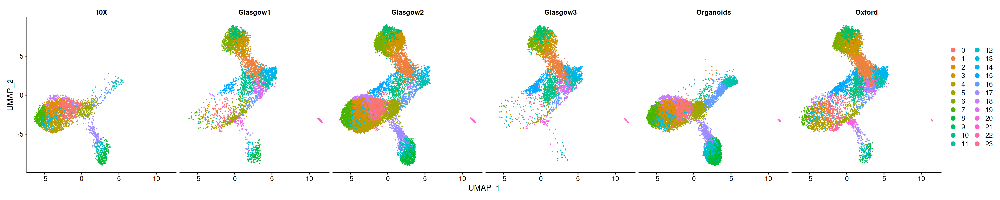

In [25]:
options(repr.plot.width=25, repr.plot.height=5)
DimPlot(mono.mac.dc, split.by=c("Experiment"))

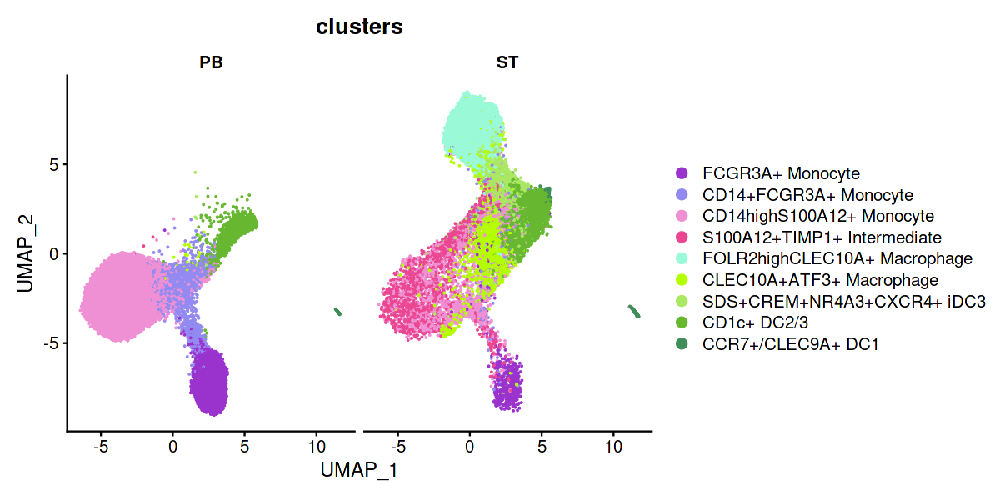

In [26]:
options(repr.plot.width=10, repr.plot.height=5)
DimPlot(mono.mac.dc, split.by=c("Tissue"), group.by="clusters", cols=orig.cols)

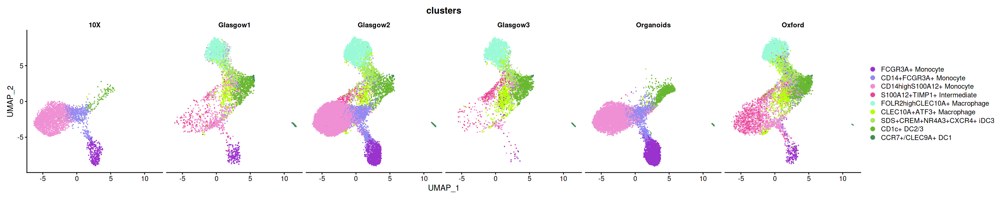

In [27]:
options(repr.plot.width=25, repr.plot.height=5)
DimPlot(mono.mac.dc, split.by=c("Experiment"), group.by="clusters", cols=orig.cols)

In [176]:
mono.mac.dc.st <- subset(mono.mac.dc, subset=Tissue=="ST")

In [29]:
Idents(mono.mac.dc.st) <- "condition"

In [30]:
table(mono.mac.dc.st$condition)


     PB_Healthy    PB_Active RA      ST_Healthy    ST_Active RA ST_Remission RA 
              0               0            2618           13531            3207 

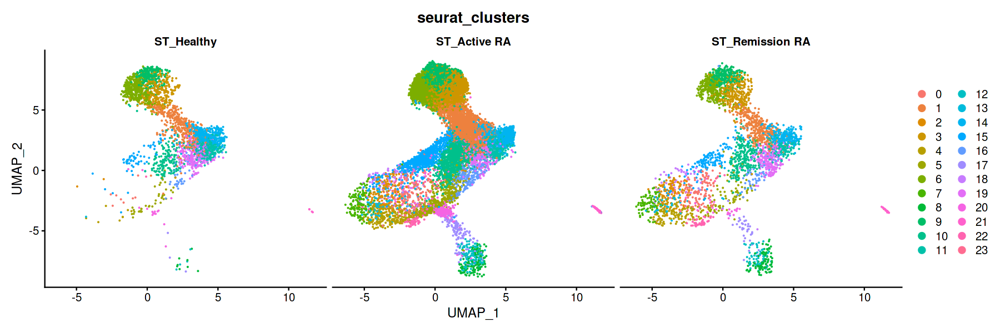

In [31]:
options(repr.plot.width=15, repr.plot.height=5)
DimPlot(mono.mac.dc.st, split.by=c("condition"), group.by="seurat_clusters")

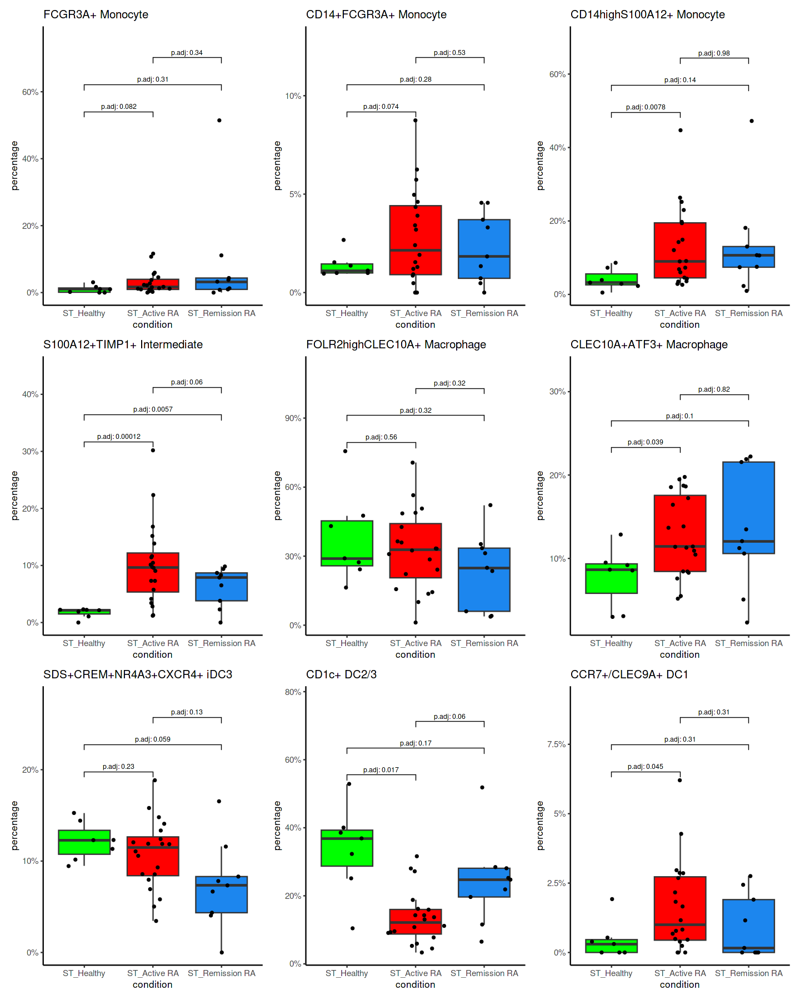

In [32]:
library(pochi)
options(repr.plot.width=12, repr.plot.height=15)
AbundancePlot(mono.mac.dc.st, group.by = "clusters", split.by = "condition", 
              replicate.by = "Unique_ID", perform.stat.test=TRUE,
              fill_colors=c("green", "red", "dodgerblue2"))

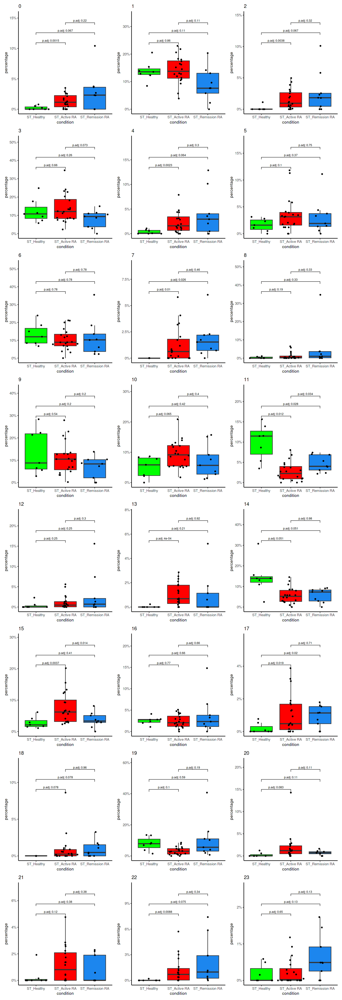

In [33]:
library(pochi)
options(repr.plot.width=12, repr.plot.height=35)
AbundancePlot(mono.mac.dc.st, group.by = "seurat_clusters", split.by = "condition", 
              replicate.by = "Unique_ID", perform.stat.test=TRUE,
              fill_colors=c("green", "red", "dodgerblue2"))

In [34]:
mono.mac.dc.st <- subset(mono.mac.dc.st, downsample=2536)

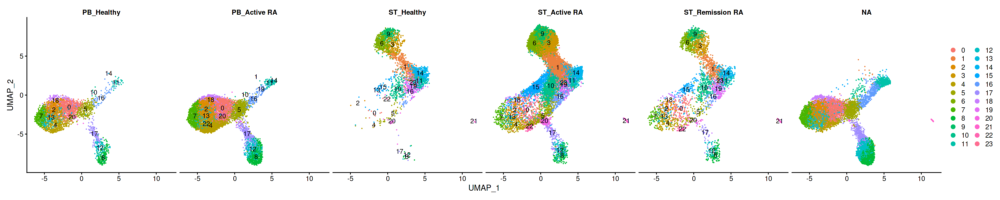

In [38]:
options(repr.plot.width=25, repr.plot.height=5)
DimPlot(mono.mac.dc, label="TRUE", split.by="condition")

In [39]:
cluster.markers <- FindAllMarkers(mono.mac.dc, only.pos=TRUE, test.use="MAST", min.pct=0.4)
cluster.markers <- cluster.markers[which(cluster.markers$p_val_adj<0.05),]

Calculating cluster 0


 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>

In [40]:
mono.mac.dc@misc <- cluster.markers

In [41]:
saveRDS(mono.mac.dc, "mono.mac.dc.rds")

In [42]:
mono.mac.dc <- readRDS("mono.mac.dc.rds")

In [43]:
top10 <- cluster.markers %>%
    group_by(cluster) %>%
    slice_max(n = 10, order_by = avg_log2FC)

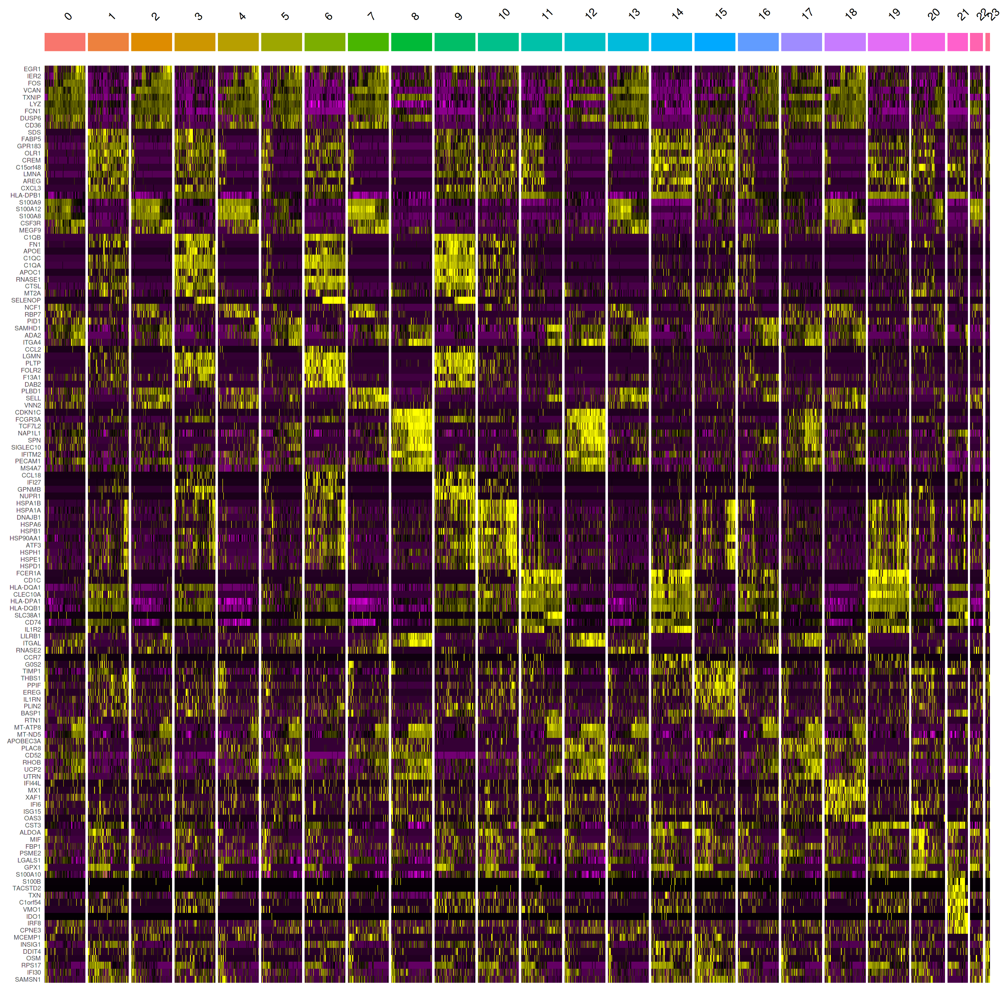

In [45]:
options(repr.plot.width=20, repr.plot.height=20)
DoHeatmap(subset(mono.mac.dc, downsample=500), features=unique(top10$gene)) + NoLegend()

In [ ]:
Idents(myeloid)

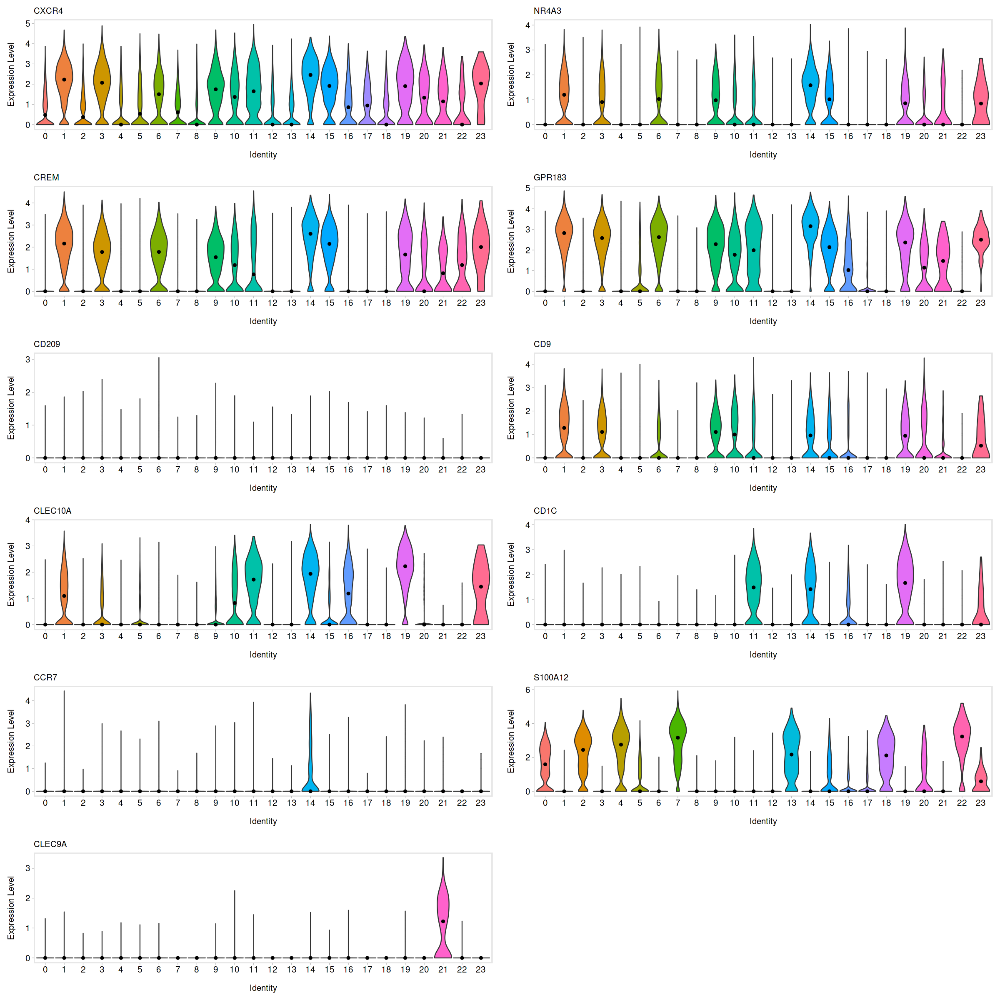

In [133]:
options(repr.plot.width=20, repr.plot.height=20)
x <- list()
for(gene in c("CXCR4","NR4A3","CREM","GPR183","CD209","CD9","CLEC10A","CD1C","CCR7","S100A12","CLEC9A")){
  x[[gene]] <- VlnPlot(mono.mac.dc, features=gene, pt.size=0,ncol=1) + stat_summary(fun = "median",
               geom = "point", color = "black") + theme_powerpoint() + NoLegend()
}
plot_grid(plotlist=x, ncol=2)

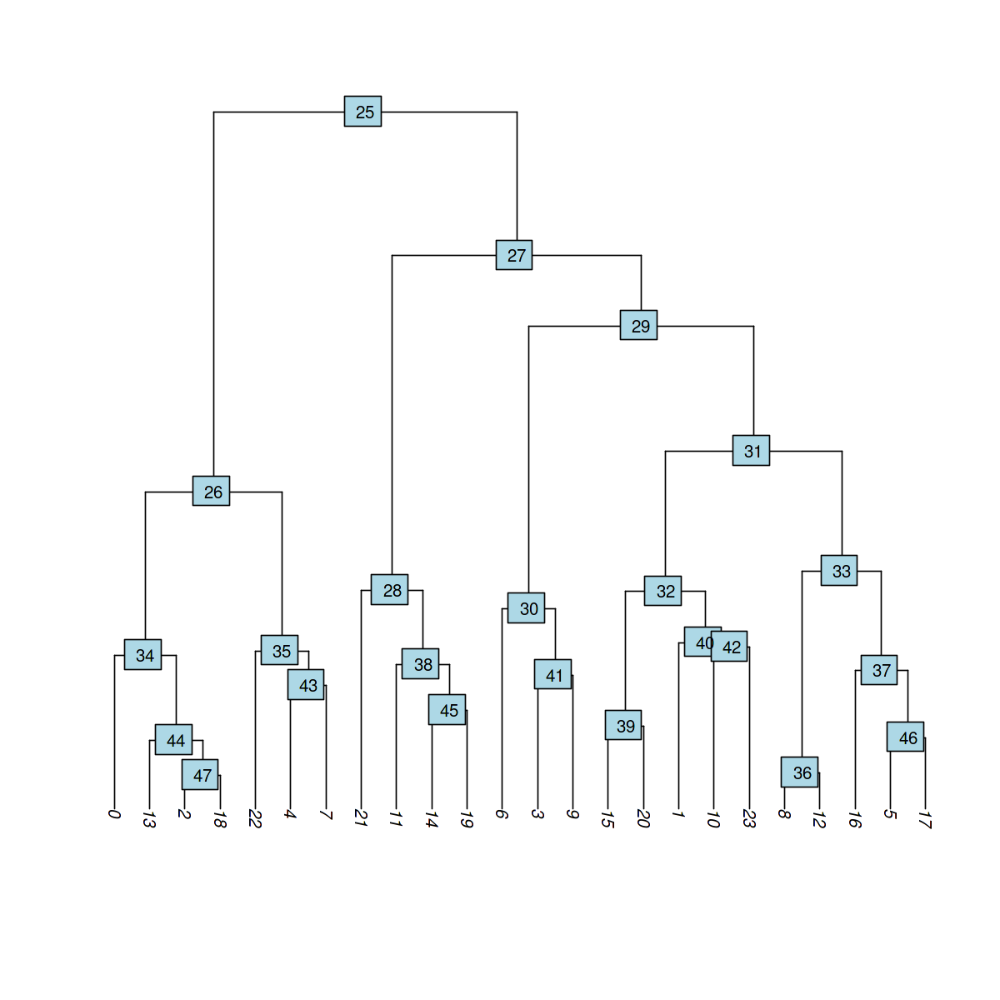

In [126]:
options(repr.plot.width=10, repr.plot.height=10)
BuildClusterTree(mono.mac.dc) %>% PlotClusterTree()  

In [92]:
h <- mono.mac.dc@meta.data %>%  
    subset(Tissue %in% "PB") %>%   with(table(integrated.pb.clusters, seurat_clusters)) %>%  
    prop.table(1) %>%  prop.table(2)
h <- h[,which(colSums(h)!=0)] %>% Heatmap(name = "Freq",column_title = stringr::str_wrap("Confusion matrix of new clusters of PB cells integrated with ST vs pb alone reference annotations", width = 35),   
        width = 20*unit(5, "mm"),height = 20*unit(5, "mm"), 
        # row_dend_side = "right",     
        heatmap_legend_param = list(       legend_direction = "horizontal",       
                                    legend_width = unit(6, "cm")     )   ) 


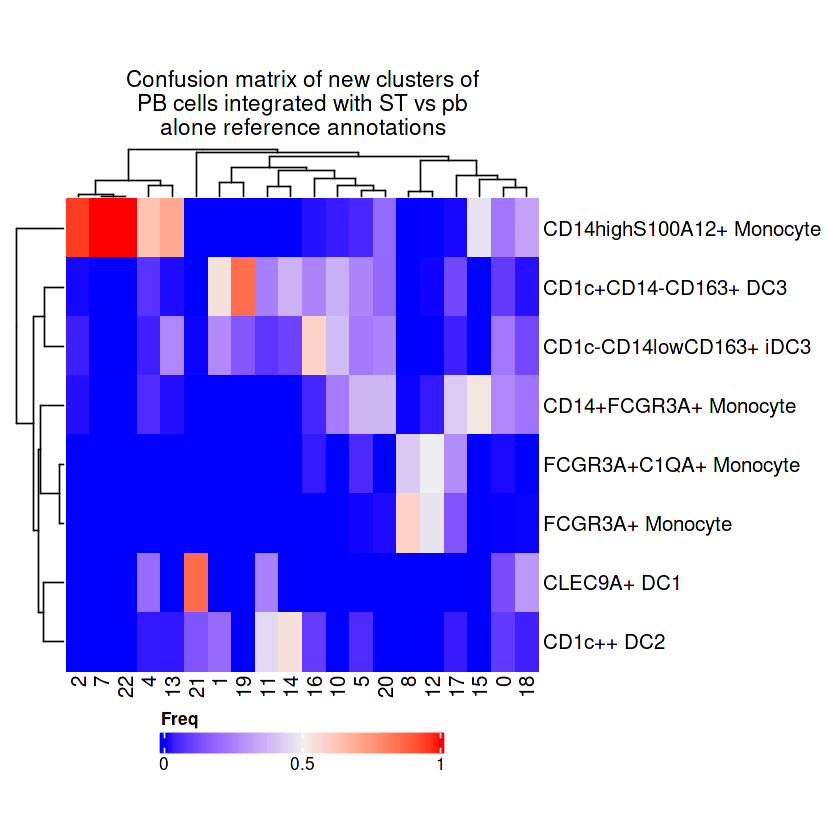

In [95]:
library(ComplexHeatmap)
options(repr.plot.width=7, repr.plot.height=7)
        draw(h, heatmap_legend_side = "bottom")

In [109]:
length(unique(mono.mac.dc$all.myeloid.clusters))

[1] 9

In [116]:
h <- mono.mac.dc@meta.data %>%  
    subset(Tissue %in% "ST") %>%  with(table(all.myeloid.clusters, seurat_clusters)) 

In [121]:
#Which clusters are no longer present?
bool <- rowSums(h)>=1

In [122]:
h <- h[which(bool==TRUE),]

In [124]:
h <- h %>%  
    prop.table(1) %>%  prop.table(2)
h <- h[,which(colSums(h)!=0)] %>% Heatmap(name = "Freq",column_title = stringr::str_wrap("Confusion matrix of new clusters of ST cells integrated with PB vs previous clustering with all myeloid cells", width = 35),   
        width = 20*unit(5, "mm"),height = 20*unit(5, "mm"), 
        # row_dend_side = "right",     
        heatmap_legend_param = list(       legend_direction = "horizontal",       
                                    legend_width = unit(6, "cm")     )   ) 


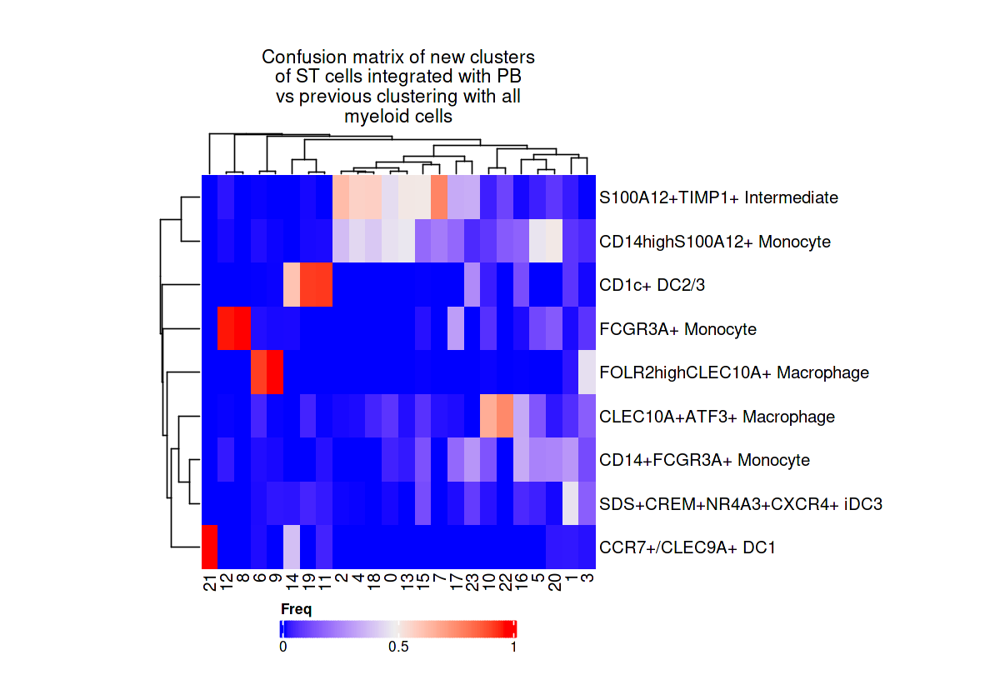

In [125]:
library(ComplexHeatmap)
options(repr.plot.width=10, repr.plot.height=7)
        draw(h, heatmap_legend_side = "bottom")

In [129]:
top10[top10$cluster=="16",]

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
2.623444e-184,1.0677911,0.535,0.147,5.022058e-180,16,FCER1A
6.609548e-149,1.0223813,0.660,0.277,1.265266e-144,16,CLEC10A
1.322848e-104,0.8730619,0.789,0.744,2.532328e-100,16,SAMHD1
4.674079e-105,0.6824564,0.483,0.207,8.947589e-101,16,RTN1
5.196855e-40,0.6635936,0.572,0.457,9.948340e-36,16,MT-ATP8
1.367507e-85,0.6364160,0.526,0.246,2.617819e-81,16,PID1
2.757597e-106,0.6127357,1.000,0.985,5.278868e-102,16,CD74
9.360278e-73,0.5831096,0.860,0.708,1.791838e-68,16,HLA-DMB
9.741989e-46,0.5733492,0.924,0.935,1.864909e-41,16,MT-ND5


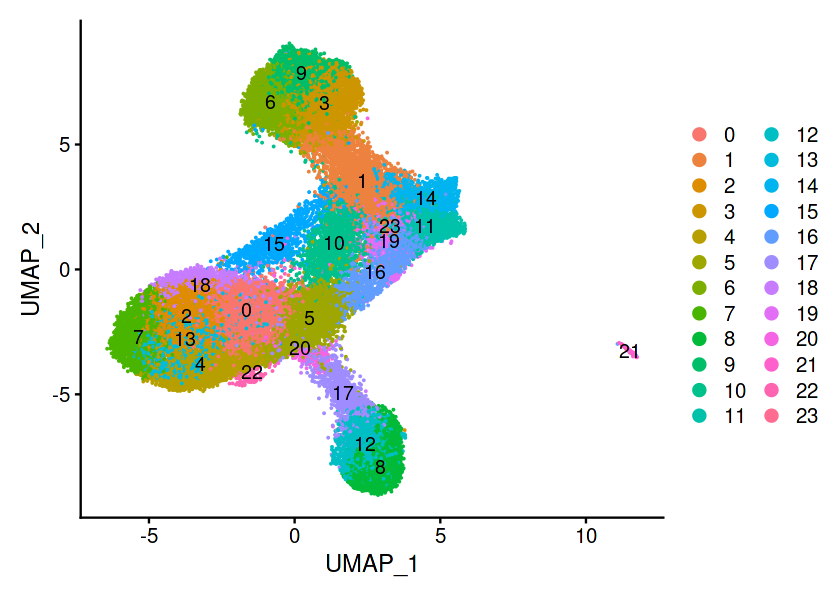

In [76]:
options(repr.plot.width=7, repr.plot.height=5)
DimPlot(mono.mac.dc, label=TRUE)

In [89]:
table(Idents(mono.mac.dc), mono.mac.dc$Tissue)

    
       PB   ST
  0  2880  314
  1    13 3001
  2  2529  290
  3     0 2745
  4  1998  454
  5  1734  677
  6     0 2135
  7  1839  238
  8  1829  236
  9     0 1848
  10   70 1546
  11  683  839
  12 1230  180
  13 1188  164
  14   10 1215
  15    7 1191
  16  620  439
  17  814  189
  18  764  140
  19    5  795
  20  127  285
  21   28  221
  22    1  156
  23    0   58

In [55]:
mono.mac.dc <- readRDS("mono.mac.dc.rds")

In [119]:
#Rename your clusters by celltype
Idents(mono.mac.dc) <- "seurat_clusters"
mono.mac.dc$mono.mac.dc.clusters <- plyr::revalue(as.character(Idents(mono.mac.dc)),
                                        c("0" = 'CD14highS100A12+ Monocyte',"1"='SDS+NR4A3+CXCR4+ tissue iDC3',
                                         "2"='CD14highS100A12+ Monocyte',"3"='FOLR2highCLEC10A+ Macrophage',
                                         "4"='CD14highS100A12+ Monocyte',"5"='CD14+FCGR3A+ Monocyte',
                                         "6"='FOLR2highCLEC10A+ Macrophage',"7"='CD14highS100A12+ Monocyte',
                                         "8"='FCGR3A+ Monocyte',"9"='FOLR2highCLEC10A+ Macrophage',
                                         "10"='CLEC10A+ATF3+ Macrophage',"11"='CD1c+ cDC',
                                         "12"='FCGR3A+ Monocyte',"13"='CD14highS100A12+ Monocyte',
                                         "14"='CD1c+ cDC',"15"='S100A12+TIMP1+ Intermediate',
                                         "16"='CD1c-CD14lowCD163+ blood iDC3',"17"='CD14+FCGR3A+ Monocyte',
                                         "18"='CD14highS100A12+ Monocyte',"19"='CD1c+ cDC',
                                         "20"='CD14+FCGR3A+ Monocyte',"21"='CLEC9A+ DC1',
                                         "22"='CD14highS100A12+ Monocyte',"23"='CLEC10A+ATF3+ Macrophage'))



In [142]:
saveRDS(mono.mac.dc, "mono.mac.dc.rds")

In [120]:
mono.mac.dc$mono.mac.dc.clusters <- as.ordered(factor(mono.mac.dc$mono.mac.dc.clusters, levels=c(
    "FCGR3A+ Monocyte","CD14+FCGR3A+ Monocyte","CD14highS100A12+ Monocyte","S100A12+TIMP1+ Intermediate","CLEC10A+ATF3+ Macrophage",'SDS+NR4A3+CXCR4+ tissue iDC3',
                                                               "CD1c+ cDC",'CD1c-CD14lowCD163+ blood iDC3',"CLEC9A+ DC1","FOLR2highCLEC10A+ Macrophage")))
Idents(mono.mac.dc) <-"mono.mac.dc.clusters"

In [121]:
cols <- c("darkorchid3","#938AF1",
                  "#EF90D4", "#EB4691","#D2CEF9","yellow", 
                  "#B4FF00","#68B731","#00689A","#51F6BC")

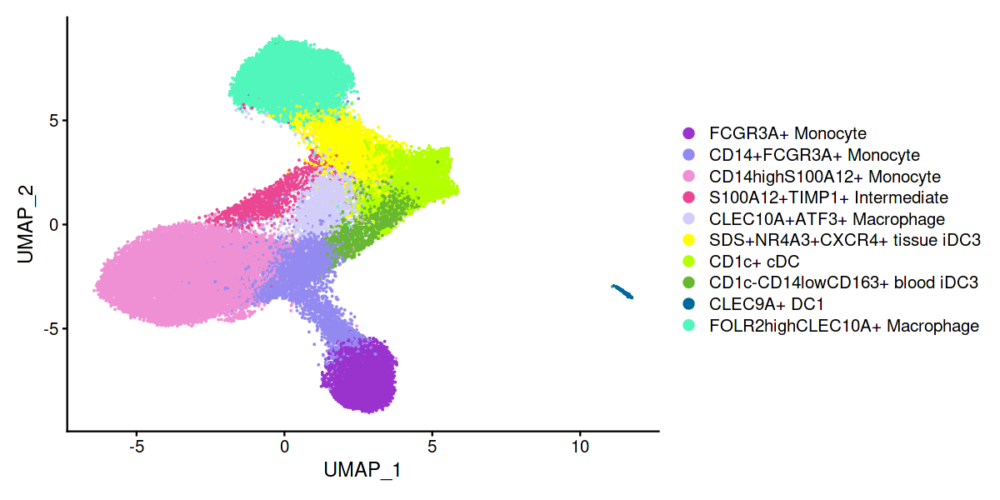

In [122]:
options(repr.plot.width=10, repr.plot.height=5)
DimPlot(mono.mac.dc, label=FALSE, cols=cols)

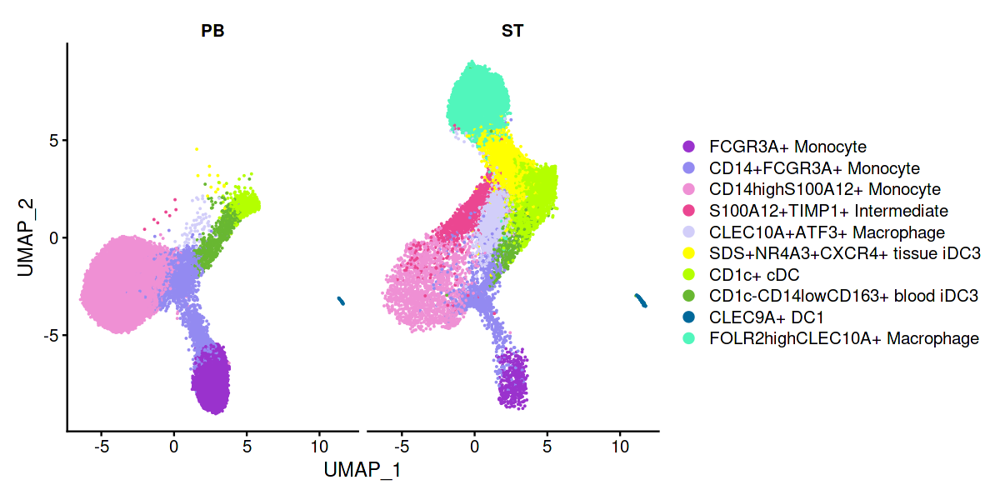

In [110]:
options(repr.plot.width=10, repr.plot.height=5)
DimPlot(mono.mac.dc, split.by="Tissue",label=FALSE, cols=cols)

In [130]:
#Rename your clusters by celltype
mono.mac.dc$Tissue <- plyr::revalue(as.character(mono.mac.dc$Tissue),
                                        c("PB"='Peripheral Blood (PB)', "ST"='Synovial Tissue (ST)'))

#Create data frame for information required to plot 
umap <- data.frame(rownames(mono.mac.dc@meta.data),Embeddings(mono.mac.dc, reduction = "umap")[,1], Embeddings(mono.mac.dc, reduction = "umap")[,2],
                   mono.mac.dc$Tissue,mono.mac.dc$condition,mono.mac.dc$mono.mac.dc.clusters)
colnames(umap) <- c("ID","UMAP1", "UMAP2", "facet_col", "Group", "color_col")

allcells <-  as.data.frame(cbind(umap$UMAP1,umap$UMAP2))
colnames(allcells) <- c("UMAP1", "UMAP2")
umap$color_col <- as.ordered(factor(umap$color_col, levels=levels(mono.mac.dc$mono.mac.dc.clusters)))
levels(umap$color_col)
umap <- umap[order(umap$ID),]
theme_specific <- theme_linedraw() + theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank()) + theme(plot.title=element_text(size=30, face="bold"), axis.text=element_text(size=15), axis.title=element_text(size=15)) + theme(strip.background = element_rect(colour = "black", fill = "white"),strip.text = element_text(size = 20, color="black"))

[1] "FCGR3A+ Monocyte"              "CD14+FCGR3A+ Monocyte"        
 [3] "CD14highS100A12+ Monocyte"     "S100A12+TIMP1+ Intermediate"  
 [5] "CLEC10A+ATF3+ Macrophage"      "SDS+NR4A3+CXCR4+ tissue iDC3" 
 [7] "CD1c+ cDC"                     "CD1c-CD14lowCD163+ blood iDC3"
 [9] "CLEC9A+ DC1"                   "FOLR2highCLEC10A+ Macrophage"

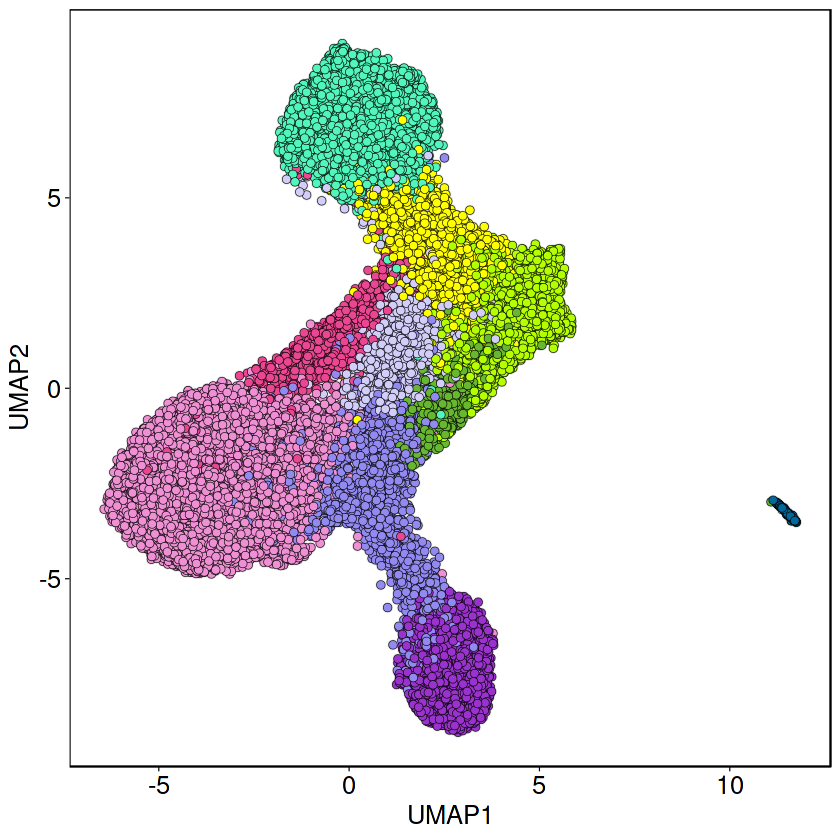

In [132]:
options(repr.plot.width=7, repr.plot.height=7)
ggplot(umap, aes(x=UMAP1, y=UMAP2)) + 
  geom_point(data=allcells, colour="grey89", fill="grey89", size=2, shape=21) +
  geom_point(aes(fill=factor(color_col)),color="black", size=2, shape=21, stroke = 1/5) + 
  scale_fill_manual(name=NULL, labels = levels(umap$color_col), guide="legend", values=cols) + theme_specific + guides(fill=FALSE) 

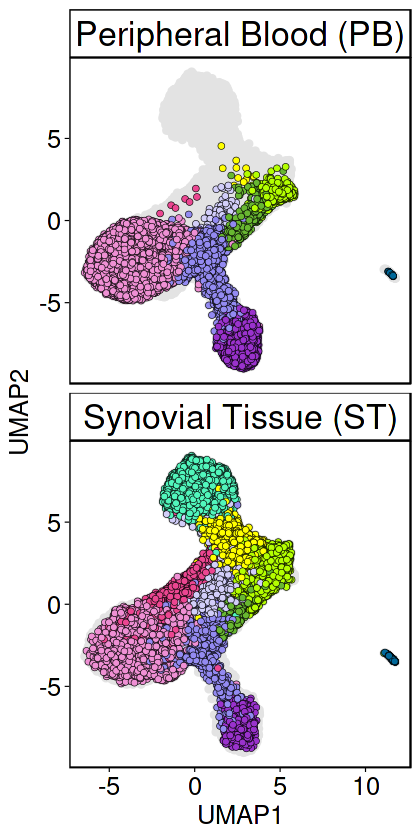

In [133]:
options(repr.plot.width=3.5, repr.plot.height=7)
ggplot(umap, aes(x=UMAP1, y=UMAP2)) + 
  geom_point(data=allcells, colour="grey89", fill="grey89", size=1.5, shape=21) +
  geom_point(aes(fill=factor(color_col)),color="black", size=1.5, shape=21, stroke = 1/5) + facet_wrap(~facet_col, ncol=1) +
  scale_fill_manual(name=NULL, labels = labels, guide="legend", values=cols) + theme_specific + guides(fill=FALSE) 

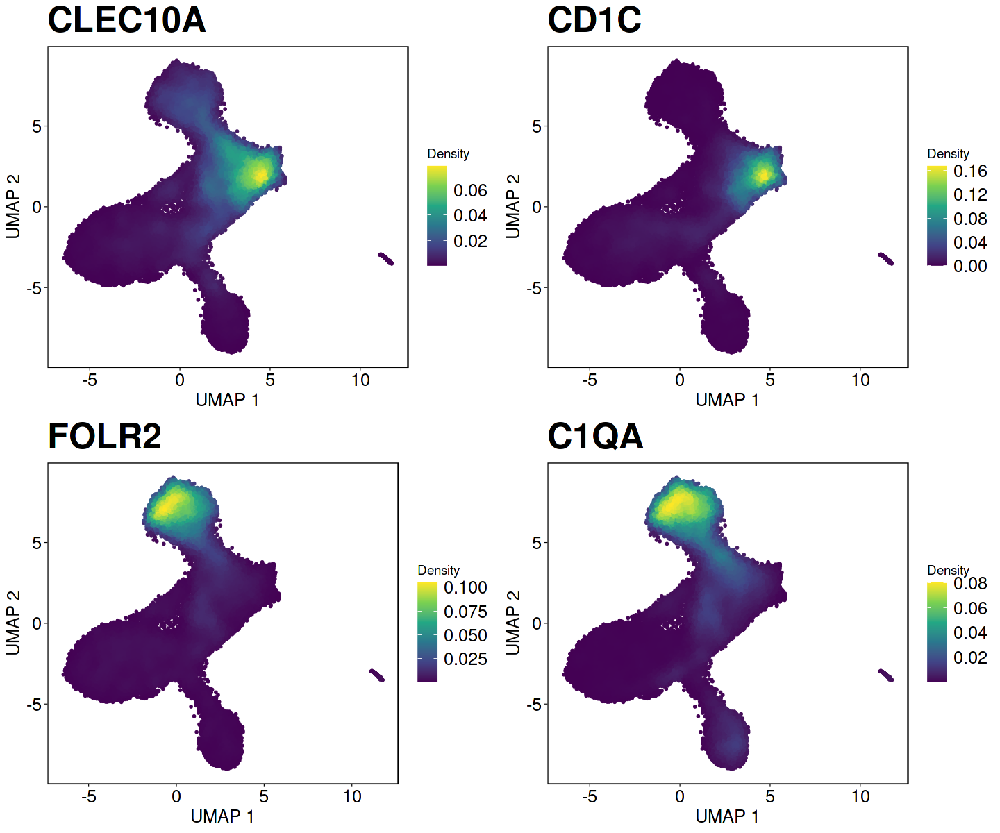

In [141]:
options(repr.plot.width=12, repr.plot.height=10)
x <- list()
for(gene in c("CLEC10A","CD1C","FOLR2","C1QA")){
  x[[gene]] <- plot_density(mono.mac.dc, gene, reduction="umap") + theme_specific + theme(legend.text=element_text(size=15))  }

plot_grid(plotlist=x, ncol=2)


In [170]:
Idents(mono.mac.dc.st) <- "mono.mac.dc.clusters"

In [22]:
glasgow3 <- subset(mono.mac.dc, subset=Experiment=="Glasgow3")

In [23]:
glasgow3

An object of class Seurat 
19143 features across 3899 samples within 1 assay 
Active assay: RNA (19143 features, 2000 variable features)
 3 dimensional reductions calculated: pca, umap, harmony

In [25]:
syno <- readRDS("/datastore/MKS_Data/UNpublished/DC_paper_Immunity/Immunity_Oxford+Glasgow1-3.rds")

In [26]:
glasgow3orig <- subset(syno, subset=Experiment=="Glasgow3")

In [27]:
rm(syno)
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,7422692,396.5,13846205,739.5,13846205,739.5
Vcells,524311743,4000.2,1605196821,12246.7,1714909614,13083.8


In [28]:
glasgow3orig <- subset(glasgow3orig, cells = Cells(glasgow3))

In [29]:
glasgow3orig

An object of class Seurat 
45231 features across 3899 samples within 2 assays 
Active assay: RNA (45068 features, 2000 variable features)
 1 other assay present: ADT
 3 dimensional reductions calculated: pca, harmony, umap

In [30]:
glasgow3[["ADT"]] <- CreateAssayObject(data=glasgow3orig@assays$ADT@data)

In [31]:
glasgow3

An object of class Seurat 
19306 features across 3899 samples within 2 assays 
Active assay: RNA (19143 features, 2000 variable features)
 1 other assay present: ADT
 3 dimensional reductions calculated: pca, umap, harmony

In [32]:
rownames(glasgow3@assays$ADT)

[1] "Hu.CD86"            "Hu.CD274"           "Hu.CD270"          
  [4] "Hu.CD155"           "Hu.CD112"           "Hu.CD47"           
  [7] "Hu.CD48"            "Hu.CD40"            "Hu.CD154"          
 [10] "Hu.CD52"            "Hu.CD3-UCHT1"       "Hu.CD8"            
 [13] "Hu.CD56"            "Hu.CD19"            "Hu.CD33"           
 [16] "Hu.CD11c"           "Hu.HLA.ABC"         "Hu.CD45RA"         
 [19] "Hu.CD123"           "Hu.CD7"             "HuMs.CD49f"        
 [22] "Hu.CD194"           "Hu.CD4-RPA.T4"      "HuMs.CD44"         
 [25] "Hu.CD14-M5E2"       "Hu.CD16"            "Hu.CD25"           
 [28] "Hu.CD45RO"          "Hu.CD279"           "Hu.TIGIT"          
 [31] "Isotype-MOPC.21"    "Isotype-MOPC.173"   "Isotype-MPC.11"    
 [34] "Isotype-RTK4530"    "Hu.CD20-2H7"        "Hu.CD335"          
 [37] "Hu.CD31"            "Hu.Podoplanin"      "Hu.CD146"          
 [40] "Hu.IgM"             "Hu.CD5"             "Hu.CD183"          
 [43] "Hu.CD195"           "Hu.CD32"            "Hu.CD196"          
 [46] "Hu.CD185"           "Hu.CD103"           "Hu.CD69"           
 [49] "Hu.CD62L"           "Hu.CD161"           "Hu.CD152"          
 [52] "Hu.CD223"           "Hu.KLRG1"           "Hu.CD27"           
 [55] "Hu.CD107a"          "Hu.CD95"            "Hu.CD134"          
 [58] "Hu.HLA.DR"          "Hu.CD1c"            "Hu.CD11b"          
 [61] "Hu.CD64"            "Hu.CD141"           "Hu.CD314"          
 [64] "Hu.CD35"            "Hu.CD57"            "Hu.CD272"          
 [67] "HuMsRt.CD278"       "Hu.CD275-B7.RP1"    "Hu.CD58"           
 [70] "Hu.CD39"            "Hu.CX3CR1"          "Hu.CD24"           
 [73] "Hu.CD21"            "Hu.CD11a"           "Hu.CD79b"          
 [76] "Hu.CD244"           "Hu.CD169"           "HuMs.integrin.b7"  
 [79] "Hu.CD268"           "Hu.CD42b"           "Hu.CD54"           
 [82] "Hu.CD62P"           "Hu.CD119"           "Hu.TCR.AB"         
 [85] "Isotype-RTK2071"    "Isotype-G0114F7"    "Isotype-RTK2758"   
 [88] "Isotype-RTK4174"    "Isotype-HTK888"     "Hu.CD192"          
 [91] "Hu.CD122"           "Hu.CD267"           "Hu.FceRIa"         
 [94] "Hu.CD41"            "Hu.CD137"           "Hu.CD43"           
 [97] "Hu.CD163"           "Hu.CD83"            "Hu.CD13"           
[100] "Hu.CD2"             "Hu.CD226-11A8"      "Hu.CD29"           
[103] "Hu.CD303"           "Hu.CD49b"           "Hu.CD61"           
[106] "Hu.CD81"            "Hu.CD55"            "Hu.IgD"            
[109] "Hu.CD18"            "Hu.CD28"            "Hu.CD38-HIT2"      
[112] "Hu.CD127"           "Hu.CD45-HI30"       "Hu.CD22"           
[115] "Hu.CD71"            "Hu.CD26"            "Hu.CD115"          
[118] "Hu.CD63"            "Hu.CD304"           "Hu.CD36"           
[121] "Hu.CD172a"          "Hu.CD72"            "Hu.CD158"          
[124] "Hu.CD93"            "Hu.CD200"           "Hu.CD49a"          
[127] "Hu.CD49d"           "Hu.CD73"            "Hu.CD9"            
[130] "Hu.TCR.Va7.2"       "Hu.TCR.Vd2"         "Hu.CD354"          
[133] "Hu.CD305-LAIR1"     "Hu.LOX.1"           "Hu.CD158e1"        
[136] "Hu.CD109"           "Hu.CD142"           "Hu.CD319"          
[139] "Hu.CD99"            "Hu.CLEC12A"         "Hu.CD151"          
[142] "Hu.CD352"           "Hu.CLEC1B"          "Hu.CD94"           
[145] "Hu.IgE"             "Hu.CD150"           "Hu.CD162"          
[148] "Hu.CD84"            "Hu.Ig.LightChain.k" "Hu.CD85j"          
[151] "Hu.CD23"            "Hu.Ig.LightChain.l" "Hu.CD328"          
[154] "Hu.GPR56"           "Hu.CD82"            "Hu.NKp80"          
[157] "Hu.CD131"           "Hu.CD74"            "Hu.CD116"          
[160] "Hu.CD37"            "Hu.CD101"           "Hu.HLA.DR.DP.DQ"   
[163] "Hu.CD88"

In [33]:
theme_specific <- theme_linedraw() + theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank()) + theme(plot.title=element_text(size=30, face="bold"), axis.text=element_text(size=15), axis.title=element_text(size=15))

In [34]:
proteins <- c("Hu.CD14-M5E2","Hu.CD16",
              "Hu.CD11b","Hu.CD64")

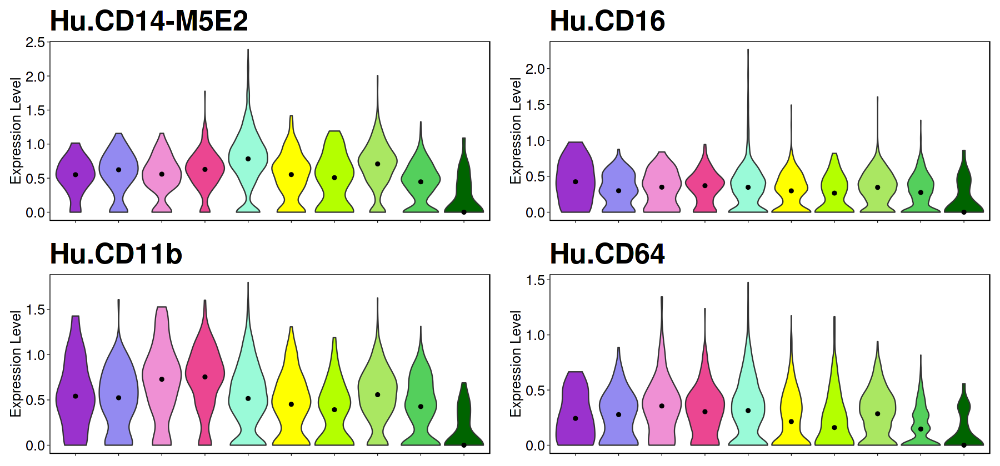

In [35]:
options(repr.plot.width=15, repr.plot.height=7)
x <- list()
DefaultAssay(glasgow3) <- "ADT"
for(protein in proteins){
  x[[protein]] <- VlnPlot(glasgow3, features=protein, pt.size=0,ncol=1, cols=new.cols) + stat_summary(fun = "median",
               geom = "point", color = "black") + theme_specific + theme(axis.text.x=element_blank(), axis.title.x=element_blank()) + NoLegend() 
}
plot_grid(plotlist=x, ncol=2)

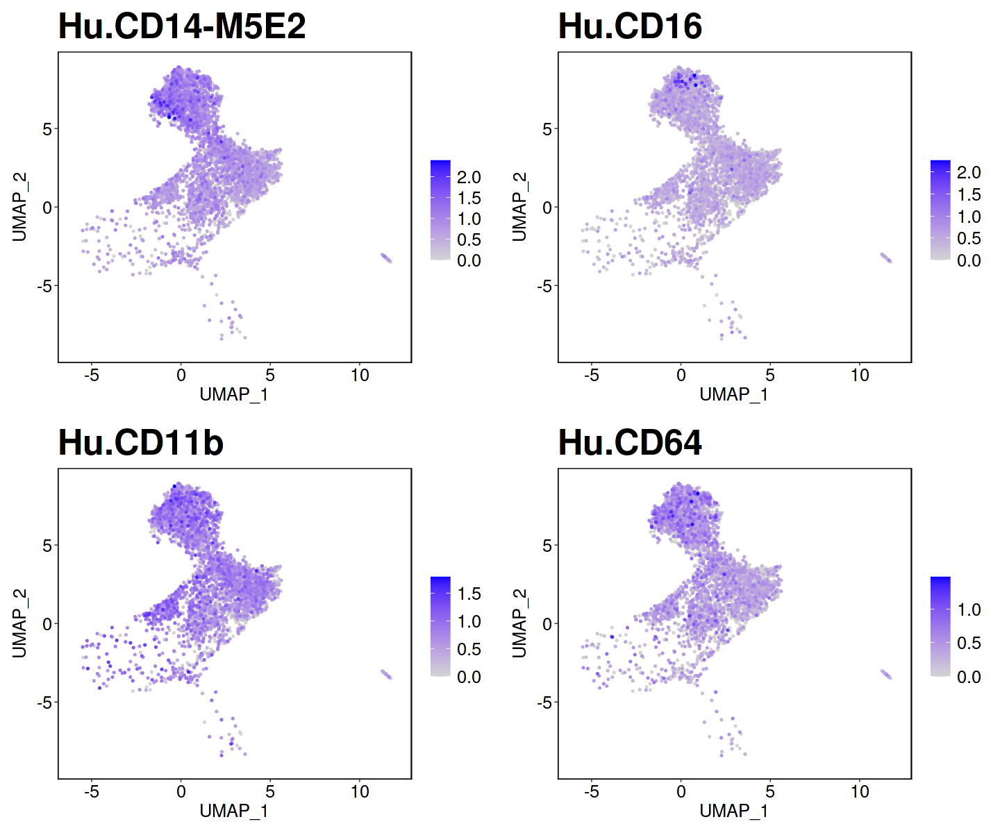

In [36]:
options(repr.plot.width=12, repr.plot.height=10)
x <- list()
for(protein in proteins){
  x[[protein]] <- FeaturePlot(glasgow3, protein, order = TRUE) + theme_specific + theme(legend.text=element_text(size=15)) }
plot_grid(plotlist=x, ncol=2)


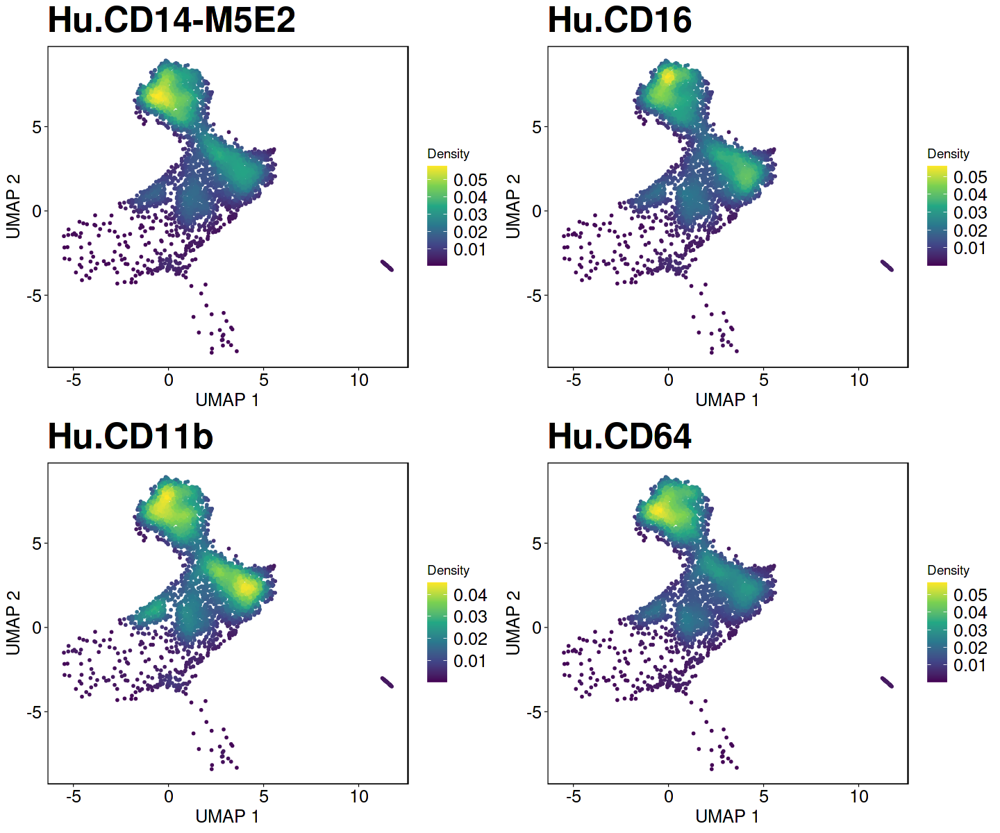

In [75]:
options(repr.plot.width=12, repr.plot.height=10)
x <- list()
for(protein in proteins){
  x[[protein]] <- plot_density(glasgow3, protein, reduction="umap") + theme_specific + theme(legend.text=element_text(size=15))  }

plot_grid(plotlist=x, ncol=2)


In [37]:
proteins <- c("Hu.CD1c","Hu.HLA.DR.DP.DQ",
              "Hu.FceRIa","Hu.CD5")

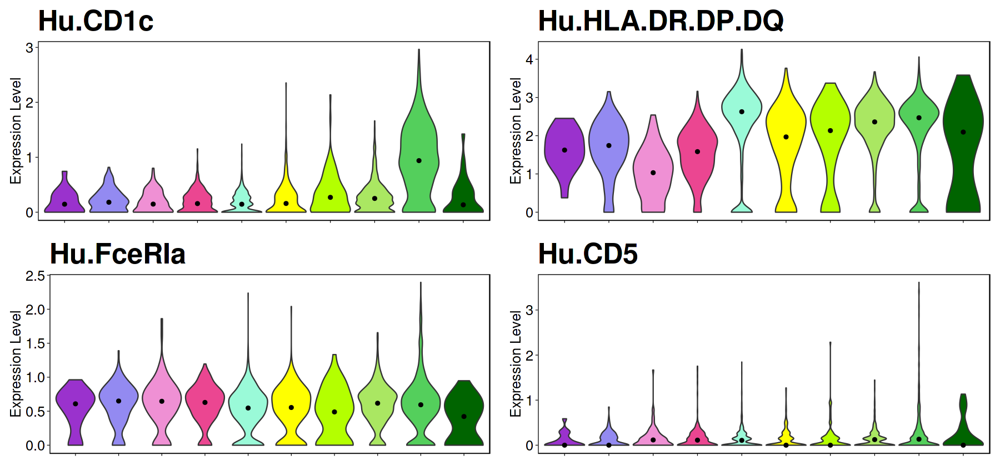

In [38]:
options(repr.plot.width=15, repr.plot.height=7)
x <- list()
DefaultAssay(glasgow3) <- "ADT"
for(protein in proteins){
  x[[protein]] <- VlnPlot(glasgow3, features=protein, pt.size=0,ncol=1, cols=new.cols) + stat_summary(fun = "median",
               geom = "point", color = "black") + theme_specific + theme(axis.text.x=element_blank(), axis.title.x=element_blank()) + NoLegend() 
}
plot_grid(plotlist=x, ncol=2)

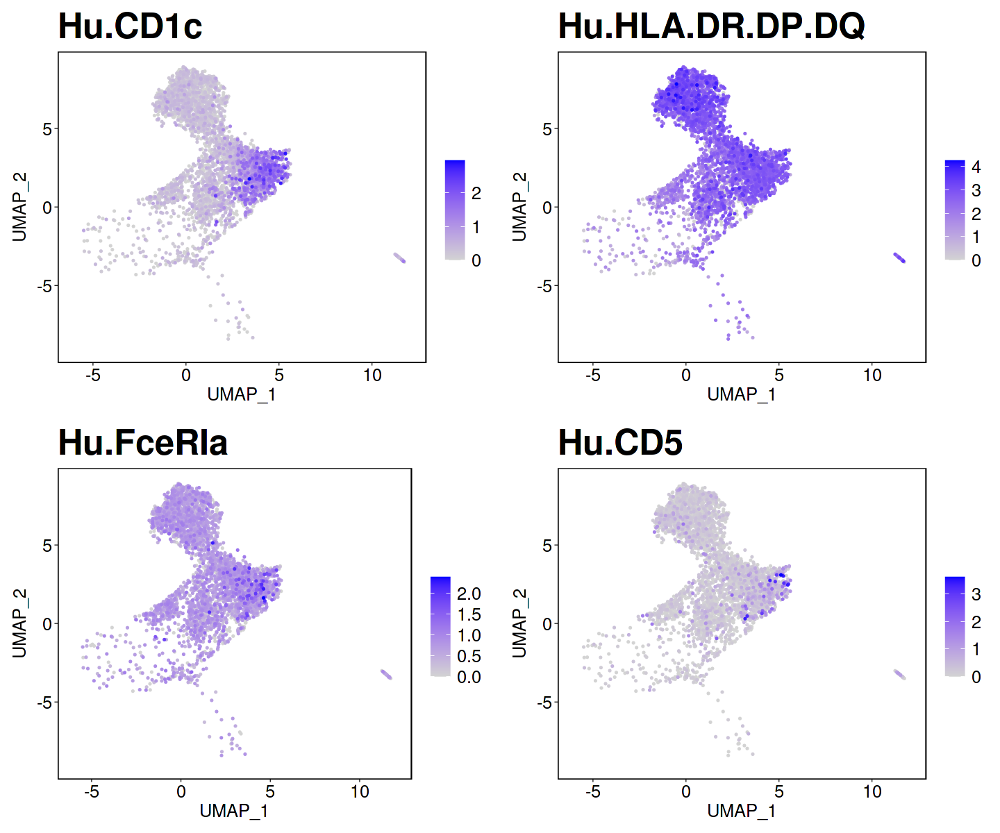

In [39]:
options(repr.plot.width=12, repr.plot.height=10)
x <- list()
for(protein in proteins){
  x[[protein]] <- FeaturePlot(glasgow3, protein, order = TRUE) + theme_specific + theme(legend.text=element_text(size=15)) }
plot_grid(plotlist=x, ncol=2)


In [40]:
proteins <- c("Hu.CD63","Hu.CD9","Hu.CD163","Hu.CD36")

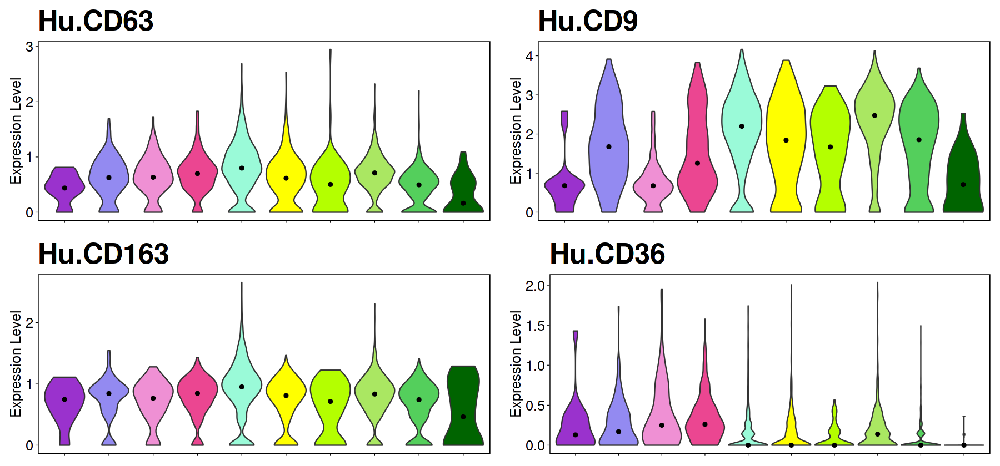

In [41]:
options(repr.plot.width=15, repr.plot.height=7)
x <- list()
DefaultAssay(glasgow3) <- "ADT"
for(protein in proteins){
  x[[protein]] <- VlnPlot(glasgow3, features=protein, pt.size=0,ncol=1, cols=new.cols) + stat_summary(fun = "median",
               geom = "point", color = "black") + theme_specific + theme(axis.text.x=element_blank(), axis.title.x=element_blank()) + NoLegend() 
}
plot_grid(plotlist=x, ncol=2)

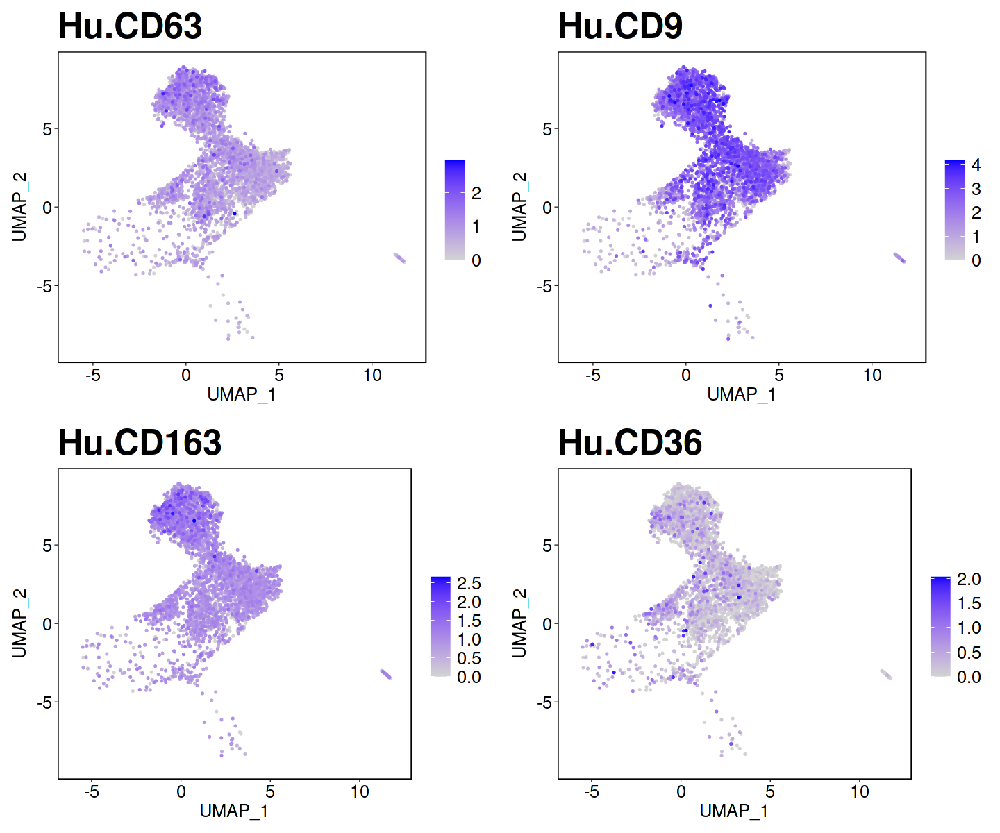

In [42]:
options(repr.plot.width=12, repr.plot.height=10)
x <- list()
for(protein in proteins){
  x[[protein]] <- FeaturePlot(glasgow3, protein, order = TRUE) + theme_specific + theme(legend.text=element_text(size=15)) }
plot_grid(plotlist=x, ncol=2)


## Differential protein expression in Glasgow 3 

In [45]:
protein.markers <- FindAllMarkers(glasgow3, test.use="MAST")

Calculating cluster FCGR3A+ Monocyte


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!

Calculating cluster CD14+FCGR3A+ Monocyte

Calculating cluster CD14highS100A12+ Monocyte


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!

Calculating cluster S100A12+TIMP1+ Intermediate


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!

Calculating cluster FOLR2highCLEC10A+ Macrophage


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!

Calculating cluster CLEC10A+ATF3+ Macrophage

Calculating cluster CD1c-CD14lowCD163+ blood iDC3


Done!

Combining coefficients and standard erro

In [46]:
protein.markers

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Hu.CD11a,1.424270e-14,0.5507097,1.000,0.846,2.321560e-12,FCGR3A+ Monocyte,Hu.CD11a
Hu.CD9,4.345110e-07,-0.7184376,0.824,0.872,7.082529e-05,FCGR3A+ Monocyte,Hu.CD9
Hu.CD45-HI30,9.319415e-05,0.2844805,1.000,0.794,1.519065e-02,FCGR3A+ Monocyte,Hu.CD45-HI30
Hu.CD48,1.204963e-04,0.3328530,0.882,0.578,1.964089e-02,FCGR3A+ Monocyte,Hu.CD48
Hu.CD11c,3.787474e-04,0.3738810,1.000,0.846,6.173583e-02,FCGR3A+ Monocyte,Hu.CD11c
Hu.CD39,1.840691e-03,-0.3125935,0.882,0.870,3.000327e-01,FCGR3A+ Monocyte,Hu.CD39
Hu.HLA.DR,7.982573e-53,-0.5058224,0.894,0.889,1.301159e-50,CD14highS100A12+ Monocyte,Hu.HLA.DR
Hu.HLA.DR.DP.DQ,3.227576e-52,-0.6243670,0.840,0.884,5.260949e-50,CD14highS100A12+ Monocyte,Hu.HLA.DR.DP.DQ
Hu.CD9.1,6.780295e-38,-0.7060721,0.851,0.873,1.105188e-35,CD14highS100A12+ Monocyte,Hu.CD9


In [51]:
clec10vsDC <- FindMarkers(glasgow3, ident.1="FOLR2highCLEC10A+ Macrophage", ident.2=c('CD1c-CD14lowCD163+ blood iDC3','SDS+CREM+NR4A3+CXCR4+ tissue iDC3',"CD1c+ DC2/3"), test.use="MAST")


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



In [52]:
clec10vsDC

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Hu.CD1c,9.134817e-63,-0.4947303,0.631,0.802,1.488975e-60
Hu.CD47,3.111672e-52,0.3189555,0.870,0.850,5.072025e-50


In [53]:
bloodiDC3vsDC2 <- FindMarkers(glasgow3, ident.1='CD1c-CD14lowCD163+ blood iDC3', ident.2=c("CD1c+ DC2/3"), test.use="MAST")


Done!

Combining coefficients and standard errors



ERROR: Error in `rownames<-`(`*tmp*`, value = "Hu.CD1c"): attempt to set 'rownames' on an object with no dimensions


In [54]:
bloodiDC3vstissueiDC3 <- FindMarkers(glasgow3, ident.1='CD1c-CD14lowCD163+ blood iDC3', ident.2=c('SDS+CREM+NR4A3+CXCR4+ tissue iDC3'), test.use="MAST")


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



In [55]:
bloodiDC3vstissueiDC3

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Hu.CD9,2.830148e-13,-0.3885747,0.788,0.931,4.613142e-11
Hu.CD47,2.885733e-11,-0.2830748,0.743,0.911,4.703744e-09
Hu.CD11a,5.697685e-10,-0.2524807,0.708,0.908,9.287227e-08
Hu.HLA.DR,1.000354e-07,-0.2520344,0.805,0.938,1.630576e-05


In [56]:
tissueiDC3vsDC2 <- FindMarkers(glasgow3, ident.1='SDS+CREM+NR4A3+CXCR4+ tissue iDC3', ident.2=c('CD1c+ DC2/3'), test.use="MAST")


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



In [57]:
tissueiDC3vsDC2

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Hu.CD1c,1.756109e-132,-0.5928148,0.762,0.846,2.862457e-130
Hu.CD305-LAIR1,6.163602e-61,0.2501043,0.901,0.707,1.004667e-58
Hu.CD9,2.573527e-31,0.2969764,0.931,0.846,4.194849e-29


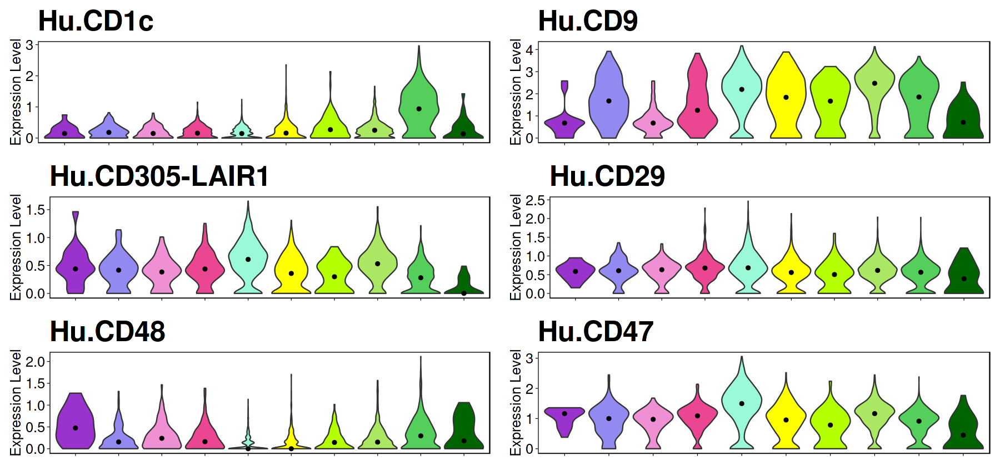

In [59]:
options(repr.plot.width=15, repr.plot.height=7)
x <- list()
DefaultAssay(glasgow3) <- "ADT"
for(protein in c("Hu.CD1c","Hu.CD9","Hu.CD305-LAIR1", "Hu.CD29", "Hu.CD48","Hu.CD47")){
  x[[protein]] <- VlnPlot(glasgow3, features=protein, pt.size=0,ncol=1, cols=new.cols) + stat_summary(fun = "median",
               geom = "point", color = "black") + theme_specific + theme(axis.text.x=element_blank(), axis.title.x=element_blank()) + NoLegend() 
}
plot_grid(plotlist=x, ncol=2)

In [60]:
glasgow3.avg <- AverageExpression(glasgow3, return.seurat=TRUE, assay="ADT")

Centering and scaling data matrix



In [61]:
glasgow3.avg <- ScaleData(glasgow3.avg)

Centering and scaling data matrix



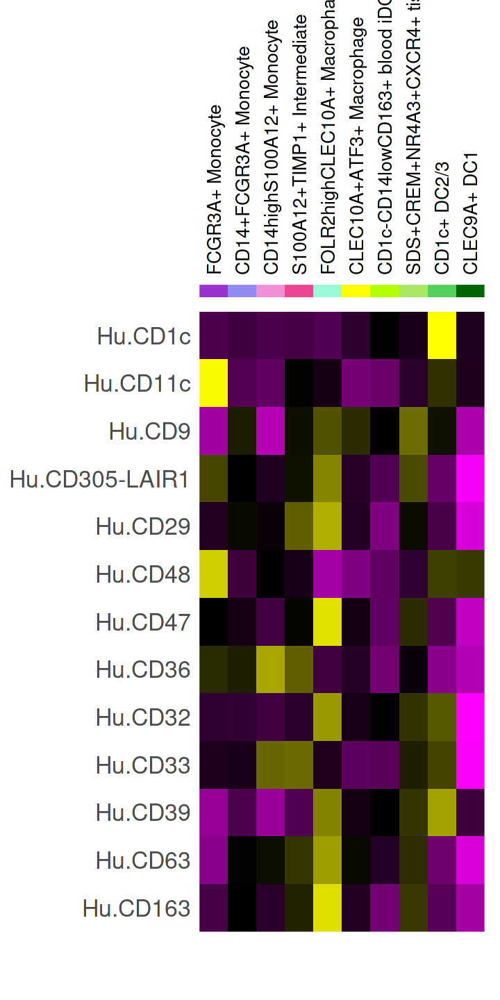

In [67]:
options(repr.plot.width=6, repr.plot.height=12)
DoHeatmap(glasgow3.avg, features=c("Hu.CD1c","Hu.CD11c","Hu.CD9","Hu.CD305-LAIR1", 
                                   "Hu.CD29", "Hu.CD48","Hu.CD47","Hu.CD36",
                                   "Hu.CD32","Hu.CD33","Hu.CD39","Hu.CD63","Hu.CD163"), 
          group.colors=new.cols, draw.lines=FALSE,angle = 90) + NoLegend() + theme(axis.text.y=element_text(size=20))

## Map back annotations to object at the start containing CLEC10A macs

In [70]:
mono.mac.dc <- readRDS("mono.mac.dc.rds")

In [71]:
#Pull metadata from clustering of whole object
myeloid.anno = mono.mac.dc@meta.data
myeloid.anno$barcode<-rownames(myeloid.anno)
head(myeloid.anno)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.hb,percent.ribo,RNA_snn_res.0.1,seurat_clusters,pANN_0.25_0.09_3,Doublets.Low.Confidence,⋯,RNA_snn_res.1,sample,integrated.clusters,integrated.pb.clusters,tissue_condition,all.myeloid.clusters,subgroup,replicate,mono.mac.dc.clusters,barcode
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<dbl>,<chr>,⋯,<fct>,<chr>,<chr>,<ord>,<ord>,<fct>,<chr>,<chr>,<ord>,<chr>
AAACCTGTCCGTAGTA-1_1_1,HC0547,3827.603,1224,5.445071,0.00000000,17.82018,0,9,0.12359551,Singlet,⋯,3,NA,NA,NA,ST_Healthy,FOLR2highCLEC10A+ Macrophage,Healthy,HC0547,FOLR2highCLEC10A+ Macrophage,AAACCTGTCCGTAGTA-1_1_1
AACACGTAGAGCTGGT-1_1_1,HC0547,8352.686,1796,3.847193,0.00000000,29.78424,5,1,0.24719101,Singlet,⋯,4,NA,NA,NA,ST_Healthy,SDS+CREM+NR4A3+CXCR4+ iDC3,Healthy,HC0547,SDS+NR4A3+CXCR4+ tissue iDC3,AACACGTAGAGCTGGT-1_1_1
AACACGTGTGACTCAT-1_1_1,HC0547,3984.288,1281,4.055848,0.02398219,20.19537,0,9,0.10112360,Singlet,⋯,3,NA,NA,NA,ST_Healthy,FOLR2highCLEC10A+ Macrophage,Healthy,HC0547,FOLR2highCLEC10A+ Macrophage,AACACGTGTGACTCAT-1_1_1
AACCATGAGAGTCGGT-1_1_1,HC0547,3902.020,1087,4.668508,0.00000000,27.30127,0,1,0.17977528,Singlet,⋯,4,NA,NA,NA,ST_Healthy,SDS+CREM+NR4A3+CXCR4+ iDC3,Healthy,HC0547,SDS+NR4A3+CXCR4+ tissue iDC3,AACCATGAGAGTCGGT-1_1_1
AACCATGGTCTCACCT-1_1_1,HC0547,2141.137,818,9.485348,0.00000000,16.32012,0,6,0.01123596,Singlet,⋯,3,NA,NA,NA,ST_Healthy,FOLR2highCLEC10A+ Macrophage,Healthy,HC0547,FOLR2highCLEC10A+ Macrophage,AACCATGGTCTCACCT-1_1_1
AACGTTGCACTGTGTA-1_1_1,HC0547,2531.420,953,11.787132,0.11446838,15.90267,0,6,0.01123596,Singlet,⋯,3,NA,NA,NA,ST_Healthy,FOLR2highCLEC10A+ Macrophage,Healthy,HC0547,FOLR2highCLEC10A+ Macrophage,AACGTTGCACTGTGTA-1_1_1


In [72]:
dc.only <- readRDS("/datastore/lucy/SynovialAtlas/CD1c/dc.only.rds")

In [73]:
dc.cols <- c("#7FCDF3", "#00689A","#0ec2a2","#43f782",
  "#a6ffef","#e5befb","#C876F7","#fdf0bb","#faf771","#fae071","#F8A640","#e38208","#FF6C67","#FF070A","#ce0062","#f776e6")
dc.only$clusters <- as.ordered(factor(dc.only$clusters, 
                                      levels=c('pre-DC CD5+AXL+SIGLEC6+',
                                               'DC1 CLEC9A+ (infiltrating)',
                                               'DC2 CD1c++AXL+',
                                               'DC2 CD1c++KLF4+ATF3+MRC1+',
                                                'DC2 CD1c++KLF4+ (infiltrating)',
                                               'DC2 MIR155HG+CCR7+ (activated)',
                                               'DC2 CCR7+LAMP3+ (migratory)',
                                               'DC2/3 CD1c+CRIP1+ (transitional)',
                                               "DC2/3 CD1c+ISG15+",
                                               'DC3 CD1c+CD14-CD163+ (infiltrating)',
                                               'DC3 CD1clowCD63+CD9+',
                                               'DC3 CD1clowTUBB4B+TIMP1+',
                                               'iDC3 CD1c-CD14lowCD163+ (infiltrating)',
                                               'iDC3 CD1c-FABP5+SDS+',
                                               'iDC3 CD1c-CLEC10A+FOLR2++C1QA+',
                                              'iDC3 CD1c-CLEC10A+NR4A3+')))
Idents(dc.only) <- "clusters"

In [74]:
theme_specific <- theme_linedraw() + theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank()) + theme(plot.title=element_text(size=30, face="bold"), axis.text=element_text(size=15), axis.title=element_text(size=15)) + theme(strip.background = element_rect(colour = "black", fill = "white"),strip.text = element_text(size = 20, color="black"))

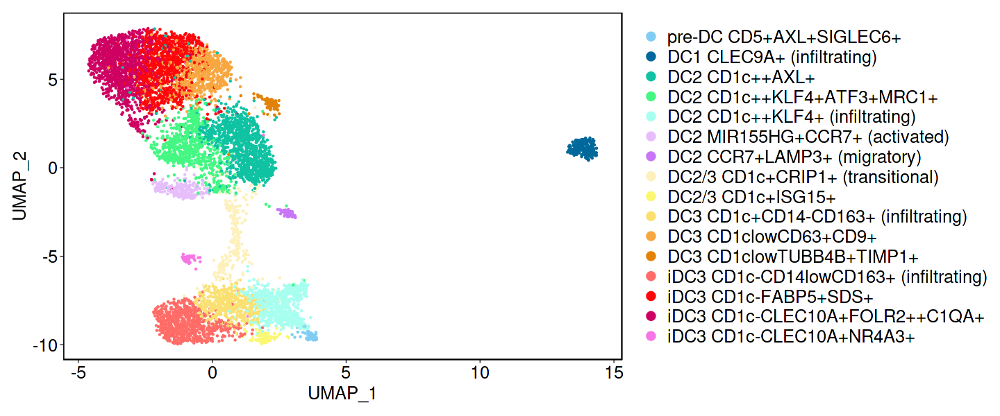

In [75]:
options(repr.plot.width=12, repr.plot.height=5)
DimPlot(dc.only, cols=dc.cols, group.by="clusters") + theme_specific + theme(plot.title=element_blank(),legend.text=element_text(size=15))

In [76]:
#Export annotations to dataframe
dc.anno <- as.data.frame(dc.only$clusters)
dc.anno$clusters <- dc.anno$`dc.only$clusters`
dc.anno$`dc.only$clusters` <- NULL
dc.anno$barcode<-rownames(dc.anno)
head(dc.anno)

,clusters,barcode
,<fct>,<chr>
AACACGTAGAGCTGGT-1_1_1,iDC3 CD1c-FABP5+SDS+,AACACGTAGAGCTGGT-1_1_1
AACCATGAGAGTCGGT-1_1_1,iDC3 CD1c-FABP5+SDS+,AACCATGAGAGTCGGT-1_1_1
ACACCCTAGGATGGAA-1_1_1,iDC3 CD1c-CLEC10A+FOLR2++C1QA+,ACACCCTAGGATGGAA-1_1_1
ACACCCTTCAAACGGG-1_1_1,iDC3 CD1c-CLEC10A+FOLR2++C1QA+,ACACCCTTCAAACGGG-1_1_1
ACACCGGAGGCCCGTT-1_1_1,DC2 CD1c++AXL+,ACACCGGAGGCCCGTT-1_1_1
ACACTGACAGGTGCCT-1_1_1,DC2 CD1c++AXL+,ACACTGACAGGTGCCT-1_1_1


In [77]:
#Put myeloid and DC annotations together
combined.anno <- left_join(myeloid.anno, dc.anno, by="barcode")
head(combined.anno)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.hb,percent.ribo,RNA_snn_res.0.1,seurat_clusters,pANN_0.25_0.09_3,Doublets.Low.Confidence,⋯,sample,integrated.clusters,integrated.pb.clusters,tissue_condition,all.myeloid.clusters,subgroup,replicate,mono.mac.dc.clusters,barcode,clusters.y
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<dbl>,<chr>,⋯,<chr>,<chr>,<ord>,<ord>,<fct>,<chr>,<chr>,<ord>,<chr>,<fct>
1,HC0547,3827.603,1224,5.445071,0.00000000,17.82018,0,9,0.12359551,Singlet,⋯,NA,NA,NA,ST_Healthy,FOLR2highCLEC10A+ Macrophage,Healthy,HC0547,FOLR2highCLEC10A+ Macrophage,AAACCTGTCCGTAGTA-1_1_1,NA
2,HC0547,8352.686,1796,3.847193,0.00000000,29.78424,5,1,0.24719101,Singlet,⋯,NA,NA,NA,ST_Healthy,SDS+CREM+NR4A3+CXCR4+ iDC3,Healthy,HC0547,SDS+NR4A3+CXCR4+ tissue iDC3,AACACGTAGAGCTGGT-1_1_1,iDC3 CD1c-FABP5+SDS+
3,HC0547,3984.288,1281,4.055848,0.02398219,20.19537,0,9,0.10112360,Singlet,⋯,NA,NA,NA,ST_Healthy,FOLR2highCLEC10A+ Macrophage,Healthy,HC0547,FOLR2highCLEC10A+ Macrophage,AACACGTGTGACTCAT-1_1_1,NA
4,HC0547,3902.020,1087,4.668508,0.00000000,27.30127,0,1,0.17977528,Singlet,⋯,NA,NA,NA,ST_Healthy,SDS+CREM+NR4A3+CXCR4+ iDC3,Healthy,HC0547,SDS+NR4A3+CXCR4+ tissue iDC3,AACCATGAGAGTCGGT-1_1_1,iDC3 CD1c-FABP5+SDS+
5,HC0547,2141.137,818,9.485348,0.00000000,16.32012,0,6,0.01123596,Singlet,⋯,NA,NA,NA,ST_Healthy,FOLR2highCLEC10A+ Macrophage,Healthy,HC0547,FOLR2highCLEC10A+ Macrophage,AACCATGGTCTCACCT-1_1_1,NA
6,HC0547,2531.420,953,11.787132,0.11446838,15.90267,0,6,0.01123596,Singlet,⋯,NA,NA,NA,ST_Healthy,FOLR2highCLEC10A+ Macrophage,Healthy,HC0547,FOLR2highCLEC10A+ Macrophage,AACGTTGCACTGTGTA-1_1_1,NA


In [156]:
#Take DC annotation unless value is NA
combined.anno$new.clusters <- ifelse(is.na(combined.anno$clusters.y), as.character(combined.anno$mono.mac.dc.clusters), as.character(combined.anno$clusters.y))
combined.anno$object <- ifelse(is.na(combined.anno$clusters.y), "new", "old")
rownames(combined.anno) <- combined.anno$barcode
head(combined.anno)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.hb,percent.ribo,RNA_snn_res.0.1,seurat_clusters,pANN_0.25_0.09_3,Doublets.Low.Confidence,⋯,tissue_condition,all.myeloid.clusters,subgroup,replicate,mono.mac.dc.clusters,barcode,clusters.y,clusters,new.clusters,object
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<dbl>,<chr>,⋯,<ord>,<fct>,<chr>,<chr>,<ord>,<chr>,<fct>,<chr>,<chr>,<chr>
AAACCTGTCCGTAGTA-1_1_1,HC0547,3827.603,1224,5.445071,0.00000000,17.82018,0,9,0.12359551,Singlet,⋯,ST_Healthy,FOLR2highCLEC10A+ Macrophage,Healthy,HC0547,FOLR2highCLEC10A+ Macrophage,AAACCTGTCCGTAGTA-1_1_1,NA,FOLR2highCLEC10A+ Macrophage,FOLR2highCLEC10A+ Macrophage,new
AACACGTAGAGCTGGT-1_1_1,HC0547,8352.686,1796,3.847193,0.00000000,29.78424,5,1,0.24719101,Singlet,⋯,ST_Healthy,SDS+CREM+NR4A3+CXCR4+ iDC3,Healthy,HC0547,SDS+NR4A3+CXCR4+ tissue iDC3,AACACGTAGAGCTGGT-1_1_1,iDC3 CD1c-FABP5+SDS+,iDC3 CD1c-FABP5+SDS+,iDC3 CD1c-FABP5+SDS+,old
AACACGTGTGACTCAT-1_1_1,HC0547,3984.288,1281,4.055848,0.02398219,20.19537,0,9,0.10112360,Singlet,⋯,ST_Healthy,FOLR2highCLEC10A+ Macrophage,Healthy,HC0547,FOLR2highCLEC10A+ Macrophage,AACACGTGTGACTCAT-1_1_1,NA,FOLR2highCLEC10A+ Macrophage,FOLR2highCLEC10A+ Macrophage,new
AACCATGAGAGTCGGT-1_1_1,HC0547,3902.020,1087,4.668508,0.00000000,27.30127,0,1,0.17977528,Singlet,⋯,ST_Healthy,SDS+CREM+NR4A3+CXCR4+ iDC3,Healthy,HC0547,SDS+NR4A3+CXCR4+ tissue iDC3,AACCATGAGAGTCGGT-1_1_1,iDC3 CD1c-FABP5+SDS+,iDC3 CD1c-FABP5+SDS+,iDC3 CD1c-FABP5+SDS+,old
AACCATGGTCTCACCT-1_1_1,HC0547,2141.137,818,9.485348,0.00000000,16.32012,0,6,0.01123596,Singlet,⋯,ST_Healthy,FOLR2highCLEC10A+ Macrophage,Healthy,HC0547,FOLR2highCLEC10A+ Macrophage,AACCATGGTCTCACCT-1_1_1,NA,FOLR2highCLEC10A+ Macrophage,FOLR2highCLEC10A+ Macrophage,new
AACGTTGCACTGTGTA-1_1_1,HC0547,2531.420,953,11.787132,0.11446838,15.90267,0,6,0.01123596,Singlet,⋯,ST_Healthy,FOLR2highCLEC10A+ Macrophage,Healthy,HC0547,FOLR2highCLEC10A+ Macrophage,AACGTTGCACTGTGTA-1_1_1,NA,FOLR2highCLEC10A+ Macrophage,FOLR2highCLEC10A+ Macrophage,new


In [157]:
mono.mac.dc <- AddMetaData(mono.mac.dc, combined.anno)

In [158]:
head(mono.mac.dc@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.hb,percent.ribo,RNA_snn_res.0.1,seurat_clusters,pANN_0.25_0.09_3,Doublets.Low.Confidence,⋯,tissue_condition,all.myeloid.clusters,subgroup,replicate,mono.mac.dc.clusters,clusters.x,barcode,clusters.y,new.clusters,object
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<dbl>,<chr>,⋯,<ord>,<fct>,<chr>,<chr>,<ord>,<ord>,<chr>,<fct>,<chr>,<chr>
AAACCTGTCCGTAGTA-1_1_1,HC0547,3827.603,1224,5.445071,0.00000000,17.82018,0,9,0.12359551,Singlet,⋯,ST_Healthy,FOLR2highCLEC10A+ Macrophage,Healthy,HC0547,FOLR2highCLEC10A+ Macrophage,FOLR2highCLEC10A+ Macrophage,AAACCTGTCCGTAGTA-1_1_1,NA,FOLR2highCLEC10A+ Macrophage,new
AACACGTAGAGCTGGT-1_1_1,HC0547,8352.686,1796,3.847193,0.00000000,29.78424,5,1,0.24719101,Singlet,⋯,ST_Healthy,SDS+CREM+NR4A3+CXCR4+ iDC3,Healthy,HC0547,SDS+NR4A3+CXCR4+ tissue iDC3,SDS+CREM+NR4A3+CXCR4+ iDC3,AACACGTAGAGCTGGT-1_1_1,iDC3 CD1c-FABP5+SDS+,iDC3 CD1c-FABP5+SDS+,old
AACACGTGTGACTCAT-1_1_1,HC0547,3984.288,1281,4.055848,0.02398219,20.19537,0,9,0.10112360,Singlet,⋯,ST_Healthy,FOLR2highCLEC10A+ Macrophage,Healthy,HC0547,FOLR2highCLEC10A+ Macrophage,FOLR2highCLEC10A+ Macrophage,AACACGTGTGACTCAT-1_1_1,NA,FOLR2highCLEC10A+ Macrophage,new
AACCATGAGAGTCGGT-1_1_1,HC0547,3902.020,1087,4.668508,0.00000000,27.30127,0,1,0.17977528,Singlet,⋯,ST_Healthy,SDS+CREM+NR4A3+CXCR4+ iDC3,Healthy,HC0547,SDS+NR4A3+CXCR4+ tissue iDC3,SDS+CREM+NR4A3+CXCR4+ iDC3,AACCATGAGAGTCGGT-1_1_1,iDC3 CD1c-FABP5+SDS+,iDC3 CD1c-FABP5+SDS+,old
AACCATGGTCTCACCT-1_1_1,HC0547,2141.137,818,9.485348,0.00000000,16.32012,0,6,0.01123596,Singlet,⋯,ST_Healthy,FOLR2highCLEC10A+ Macrophage,Healthy,HC0547,FOLR2highCLEC10A+ Macrophage,FOLR2highCLEC10A+ Macrophage,AACCATGGTCTCACCT-1_1_1,NA,FOLR2highCLEC10A+ Macrophage,new
AACGTTGCACTGTGTA-1_1_1,HC0547,2531.420,953,11.787132,0.11446838,15.90267,0,6,0.01123596,Singlet,⋯,ST_Healthy,FOLR2highCLEC10A+ Macrophage,Healthy,HC0547,FOLR2highCLEC10A+ Macrophage,FOLR2highCLEC10A+ Macrophage,AACGTTGCACTGTGTA-1_1_1,NA,FOLR2highCLEC10A+ Macrophage,new


In [159]:
unique(mono.mac.dc$new.clusters)

[1] "FOLR2highCLEC10A+ Macrophage"          
 [2] "iDC3 CD1c-FABP5+SDS+"                  
 [3] "iDC3 CD1c-CLEC10A+FOLR2++C1QA+"        
 [4] "DC2 CD1c++AXL+"                        
 [5] "DC2 CD1c++KLF4+ATF3+MRC1+"             
 [6] "DC2/3 CD1c+CRIP1+ (transitional)"      
 [7] "DC2 MIR155HG+CCR7+ (activated)"        
 [8] "DC2 CD1c++KLF4+ (infiltrating)"        
 [9] "iDC3 CD1c-CD14lowCD163+ (infiltrating)"
[10] "CD14highS100A12+ Monocyte"             
[11] "CLEC10A+ATF3+ Macrophage"              
[12] "CD14+FCGR3A+ Monocyte"                 
[13] "S100A12+TIMP1+ Intermediate"           
[14] "pre-DC CD5+AXL+SIGLEC6+"               
[15] "FCGR3A+ Monocyte"                      
[16] "DC3 CD1clowTUBB4B+TIMP1+"              
[17] "DC3 CD1clowCD63+CD9+"                  
[18] "iDC3 CD1c-CLEC10A+NR4A3+"              
[19] "DC2/3 CD1c+ISG15+"                     
[20] "DC3 CD1c+CD14-CD163+ (infiltrating)"   
[21] "DC1 CLEC9A+ (infiltrating)"            
[22] "DC2 CCR7+LAMP3+ (migratory)"

In [160]:
mono.mac.dc$new.clusters <- as.ordered(factor(mono.mac.dc$new.clusters, levels=c("FCGR3A+ Monocyte","CD14+FCGR3A+ Monocyte","CD14highS100A12+ Monocyte",'S100A12+TIMP1+ Intermediate',"FOLR2highCLEC10A+ Macrophage","CLEC10A+ATF3+ Macrophage",
                                                               
                                               'DC1 CLEC9A+ (infiltrating)',
                                               'DC2 CD1c++AXL+',
                                               'DC2 CD1c++KLF4+ATF3+MRC1+',
                                                'DC2 CD1c++KLF4+ (infiltrating)',
                                               'DC2 MIR155HG+CCR7+ (activated)',
                                               'DC2 CCR7+LAMP3+ (migratory)',
                                               'DC2/3 CD1c+CRIP1+ (transitional)',
                                               'DC3 CD1c+CD14-CD163+ (infiltrating)',
                                               'DC3 CD1clowCD63+CD9+',
                                               'DC3 CD1clowTUBB4B+TIMP1+',
                                               'iDC3 CD1c-CD14lowCD163+ (infiltrating)',
                                               'iDC3 CD1c-FABP5+SDS+',
                                               'iDC3 CD1c-CLEC10A+FOLR2++C1QA+'
                                                            )))
Idents(mono.mac.dc) <- "new.clusters"


In [161]:
new.cols <- c("grey","grey",
                  "grey", "grey","grey","grey",
             "#00689A","#0ec2a2","#43f782",
  "#a6ffef","#e5befb","#C876F7","#fdf0bb","#fae071","#F8A640","#e38208","#FF6C67","#FF070A","#ce0062")

In [167]:
unique(mono.mac.dc$object)

[1] "new" "old"

In [162]:
#Create data frame for information required to plot 
umap <- data.frame(rownames(mono.mac.dc@meta.data),Embeddings(mono.mac.dc, reduction = "umap")[,1], Embeddings(mono.mac.dc, reduction = "umap")[,2],
                   mono.mac.dc$Tissue,mono.mac.dc$condition,mono.mac.dc$new.clusters, mono.mac.dc$object)
colnames(umap) <- c("ID","UMAP1", "UMAP2", "Tissue", "Group", "Cluster", "Object")

#Save
write.csv(umap, "single.cell-umap.plot.csv")

allcells <-  as.data.frame(cbind(umap$UMAP1,umap$UMAP2))
colnames(allcells) <- c("UMAP1", "UMAP2")

In [163]:
umap$Cluster <- as.ordered(factor(umap$Cluster, levels=levels(mono.mac.dc$new.clusters)))
umap <- umap[order(umap$ID),]

In [164]:
names(new.cols) <- levels(mono.mac.dc$new.clusters)

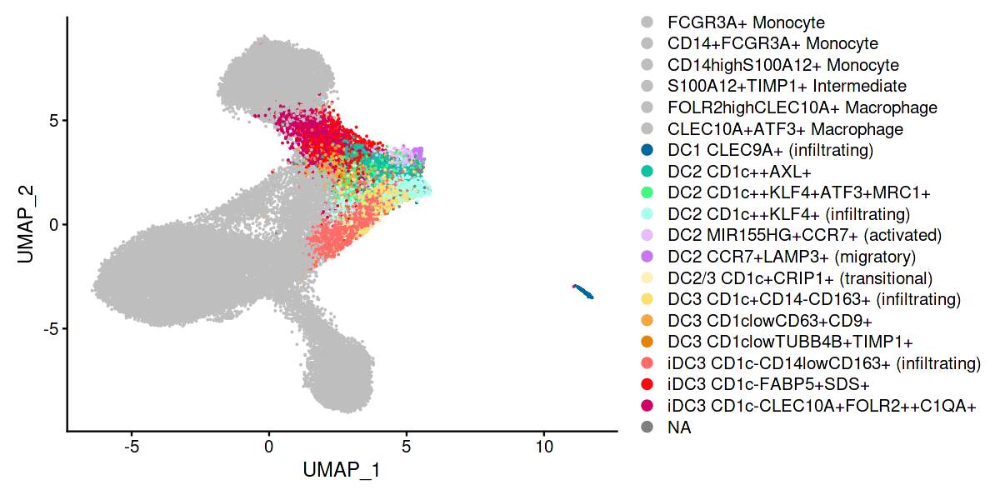

In [165]:
options(repr.plot.width=10, repr.plot.height=5)
DimPlot(mono.mac.dc, cols=new.cols)

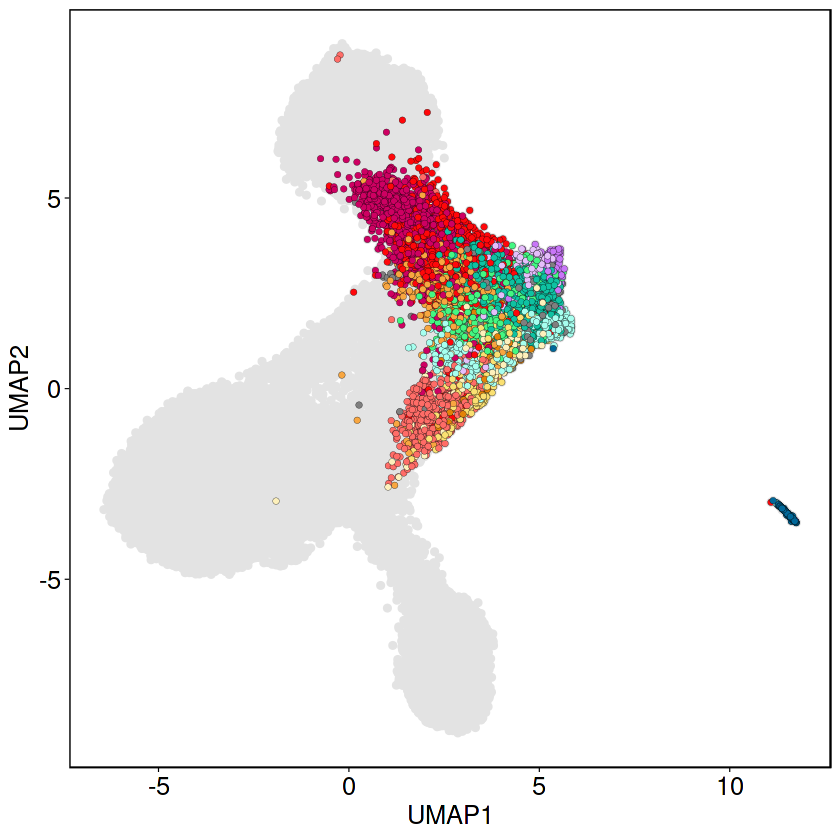

In [174]:
options(repr.plot.width=7, repr.plot.height=7)
ggplot(umap, aes(x=UMAP1, y=UMAP2)) + 
  geom_point(data=allcells, colour="grey89", fill="grey89", size=1.5, shape=21) +
  geom_point(data=umap[which(umap$Object%in%"old"),], aes(fill=factor(Cluster)),color="black", size=1.5, shape=21, stroke = 1/10) + 
  scale_fill_manual(name=NULL, labels = levels(umap$Cluster), guide="legend", values=new.cols) + theme_specific + guides(fill=FALSE)